#Projeto Machine Learning - Grupo 2 - Turma 1115

Professores: Jorge Cristhian Chamby Díaz e Gustavo Lins

Colaboradores

*   Ane Caroline - https://www.linkedin.com/in/anecarolineferreira/
*   Chen Yen Pin - https://www.linkedin.com/in/chen-yen-pin/
*   Jesya de Lima - https://www.linkedin.com/in/jesyadelima/
*   Gabriel Vilarinho - https://www.linkedin.com/in/gabriel-vilarinho/
*   Gabriel Alvarenga - https://www.linkedin.com/in/gabriel-alvarenga-rocha-994b5120a/
*   Renan Silva - https://www.linkedin.com/in/renan-msilva?utm_source=share&utm_campaign=share_via&utm_content=profile&utm_medium=android_app
*  Marcel Cleres - https://www.linkedin.com/in/marcelcleres/

### Dataset: Brazilian E-Commerce Public Dataset by Olist

Conjunto de dados públicos de comércio eletrônico brasileiro por Olist

Este é um conjunto de dados públicos de comércio eletrônico brasileiro de pedidos feitos na Olist Store. O conjunto de dados contém informações de 100 mil pedidos de 2016 a 2018 feitos em vários marketplaces no Brasil. Seus recursos permitem visualizar um pedido em múltiplas dimensões: desde status do pedido, preço, desempenho de pagamento e frete até localização do cliente, atributos do produto e finalmente avaliações escritas pelos clientes. Também um conjunto de dados de geolocalização que relaciona os CEPs brasileiros às coordenadas lat/lng.

Estes são dados comerciais reais, foram anonimizados e as referências às empresas e parceiros no texto da revisão foram substituídas pelos nomes das grandes casas de Game of Thrones.

Olist, a maior loja de departamentos dos mercados brasileiros. Olist conecta pequenas empresas de todo o Brasil a canais sem complicações e com um único contrato. Esses comerciantes podem vender seus produtos através da Olist Store e enviá-los diretamente aos clientes usando os parceiros logísticos da Olist. Veja mais em nosso site: www.olist.com

Depois que um cliente compra o produto na Olist Store, um vendedor é notificado para atender ao pedido. Assim que o cliente recebe o produto, ou vence a data estimada de entrega, o cliente recebe por e-mail uma pesquisa de satisfação onde pode dar uma nota da experiência de compra e anotar alguns comentários.
Atenção:Um pedido pode ter vários itens.
Cada item pode ser entregue por um vendedor distinto.
Todos os textos de identificação de lojas e parceiros foram substituídos pelos nomes das grandes casas de Game of Thrones.

Link do dataset: https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce/data

O dataset é composto por 9 arquivos csvs, neste estudo abordaremos a análise do perfil dos clientes, abaixo consta a imagem que exemplifica a forma de conexão entre os arquivos.Para o inicio da análise é preciso realizar alguns merges para obter as colunas necessárias  no estudo.

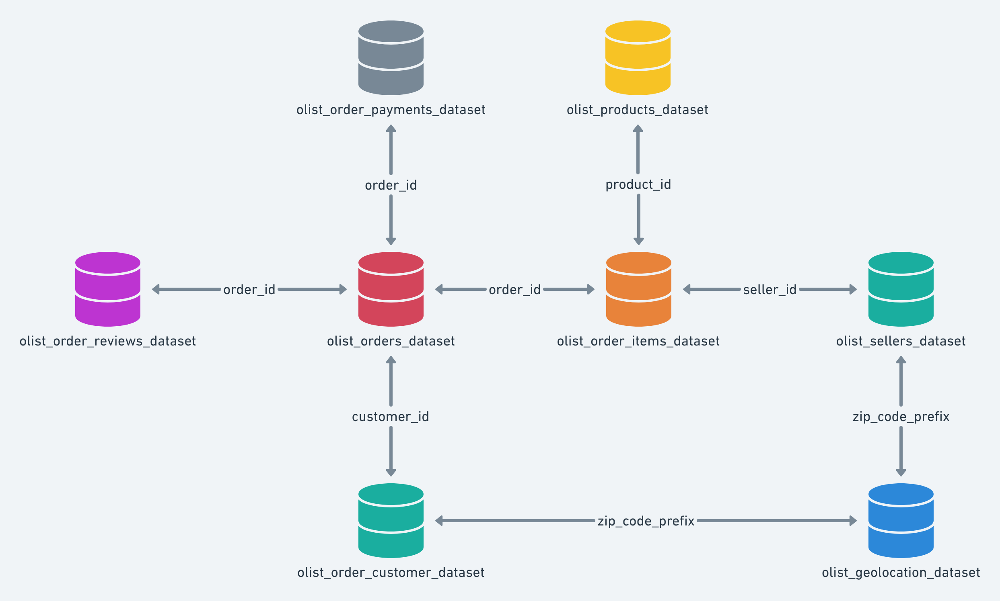

###Algumas colunas importantes do dataset.

    product_id: Identificador único para cada produto no dataset.
    order_id : Identificado único para cada pedido no dataset- lembrando que em um pedido podem existir vários produtos.
    product_category_name: Categoria do produto, como "eletrônicos", "livros", "roupas", etc.
    price: o valor do produto.
    freight_value: Valor do frete para a entrega do produto.
    payment_value é o valor do pedido.
    payment_sequential: Número sequencial do pagamento, representando a ordem dos pagamentos relacionados a um pedido específico.
    payment_type: Tipo de pagamento utilizado, como cartão de crédito, boleto bancário, voucher, ou transferência bancária.
    payment_installments: Número de parcelas em que o pagamento foi dividido.
    payment_value: Valor total pago na transação.
    customer_city: Cidade onde o cliente está localizado.
    customer_state: Estado onde o cliente está localizado.
    latitude e longitude : daquela cidade

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install yellowbrick
!pip install sidetable
!pip install kmodes

In [97]:
import pandas as pd
import numpy as np
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns
import geopandas
from geopandas.datasets import get_path
import missingno as msno
import sidetable as stb

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import scale,StandardScaler,LabelEncoder,Normalizer,OrdinalEncoder,OneHotEncoder,MinMaxScaler,PowerTransformer,RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,silhouette_score,roc_curve,roc_auc_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from kmodes.kprototypes import KPrototypes
from sklearn.pipeline import Pipeline

###Analisando as colunas existentes e as relações com as outras tabelas

In [5]:
order=pd.read_csv("/content/drive/MyDrive/ADA-DS/Machine Learning/Projeto/olist_orders_dataset.csv")
order.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [6]:
order_itens=pd.read_csv("/content/drive/MyDrive/ADA-DS/Machine Learning/Projeto/olist_order_items_dataset.csv")
order_itens.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [7]:
order_payments=pd.read_csv("/content/drive/MyDrive/ADA-DS/Machine Learning/Projeto/olist_order_payments_dataset.csv")
order_payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [8]:
products=pd.read_csv("/content/drive/MyDrive/ADA-DS/Machine Learning/Projeto/olist_products_dataset.csv")
products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


###Analisando os arquivos de endereço dos clientes, comparando com os dados do arquivo de coordenadas de geolocalização

Nesta análise foi possível verificar que as colunas com nome de cidade não seguem um padrão, ou seja, uma mesma cidade vem escrita com diversas formas diferentes, e os distritos estão vindo como cidades diferentes, e na verdade deveriam vir com o nome da cidade que do qual pertence.Para ter uma coordenada de localização mais precisa, realizamos o tratamento abaixo.

In [9]:
customers=pd.read_csv("/content/drive/MyDrive/ADA-DS/Machine Learning/Projeto/olist_customers_dataset.csv")
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [10]:
customers[customers['customer_zip_code_prefix'] ==1151]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
17280,8d401266c416fe74129569742199d75f,632b9f83894a36849b293ce84d62d399,1151,sao paulo,SP
27142,4eb9eccb3b24a747f725dbee821a88b7,15f755c9f45213070f1b781ed78ea55c,1151,sao paulo,SP
48774,3532ba38a3fd242259a514ac2b6ae6b6,4fa4365000c7090fcb8cad5713c6d3db,1151,sao paulo,SP
54656,dc6c74aedc9324030804b25fa1021b17,6be824f2933ae5094244f962068ca531,1151,sao paulo,SP
67534,8c55956d70fca64193668429b9f8d8ce,61a7c7a2d1ee1715b63e0d22a1129fc5,1151,sao paulo,SP
81540,e9490b645b17d03cfde928d84d38a916,b00fa88d0838e8f9ecc8c34356655c4e,1151,sao paulo,SP
82361,188ac4e8b7765d24cdb434112a99111f,27a42ae2a62b4442dd98ec2e16193118,1151,sao paulo,SP
91845,020fff139f1af3a6dff28456f386fe2d,00705dcbc0b9cad67abd658612770905,1151,sao paulo,SP


In [11]:
geolocation=pd.read_csv("/content/drive/MyDrive/ADA-DS/Machine Learning/Projeto/olist_geolocation_dataset.csv")
geolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [12]:
geolocation[geolocation['geolocation_zip_code_prefix'] ==1151]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
1474,1151,-23.527788,-46.660310,sao paulo,SP
1485,1151,-23.531421,-46.656262,sao paulo,SP
1526,1151,-23.531294,-46.656404,sao paulo,SP
1528,1151,-23.533334,-46.654074,sao paulo,SP
1533,1151,-23.532469,-46.656487,sao paulo,SP
...,...,...,...,...,...
3254,1151,-23.530118,-46.657771,sao paulo,SP
3256,1151,-23.531294,-46.656404,sao paulo,SP
3262,1151,-23.530159,-46.657632,sao paulo,SP
3274,1151,-23.533334,-46.654074,sao paulo,SP


In [13]:
customers.groupby('customer_zip_code_prefix')['customer_city'].apply(list)

customer_zip_code_prefix
1003                                           [sao paulo]
1004                                [sao paulo, sao paulo]
1005     [sao paulo, sao paulo, sao paulo, sao paulo, s...
1006                                [sao paulo, sao paulo]
1007          [sao paulo, sao paulo, sao paulo, sao paulo]
                               ...                        
99960                                   [charrua, charrua]
99965                             [agua santa, agua santa]
99970                                            [ciriaco]
99980                   [david canabarro, david canabarro]
99990                                          [muliterno]
Name: customer_city, Length: 14994, dtype: object

In [14]:
customers.groupby('customer_city')['customer_zip_code_prefix'].apply(list)

customer_city
abadia dos dourados                                [38540, 38540, 38540]
abadiania                                                        [72940]
abaete                 [35620, 35620, 35620, 35620, 35620, 35620, 356...
abaetetuba             [68440, 68440, 68440, 68440, 68440, 68440, 684...
abaiara                                                   [63240, 63240]
                                             ...                        
xinguara               [68557, 68555, 68557, 68555, 68555, 68555, 685...
xique-xique                                        [47400, 47400, 47400]
zacarias                                                  [15265, 15265]
ze doca                              [65365, 65365, 65365, 65365, 65365]
zortea                                                    [89633, 89633]
Name: customer_zip_code_prefix, Length: 4119, dtype: object

Aqui consta o mapeamento para algumas alterações percebidas, tentando padronizar as cidades contidas no arquivo de clientes.

In [15]:
corrigindo_cidade = {
  ("arraial d'ajuda" , 'BA'): 'porto seguro',
  ('abrantes', 'BA'): 'camacari',
  ('arraial d ajuda', 'BA'): 'porto seguro',
  ('bataipora', 'MS'): 'bataypora',
  ('brasopolis', 'MG'): 'brazopolis',
  ('cachoeiras de macacu', 'RJ'): 'papucaia',
  ('ceilandia', 'DF'): 'brasilia',
  ('colonia vitoria', 'PR'): 'vitoria',
  ('dias d avila', 'BA'): "dias d'avila",
  ('embu', 'SP'): 'embu das artes',
  ('estrela d oeste', 'SP'): "estrela d'oeste",
  ('fragosos', 'SC'): 'campo alegre',
  ('guara', 'DF'): 'brasilia',
  ('itamira', 'BA'): 'apora',
  ('itapage', 'CE'): 'itapaje',
  ('jaguariuna', 'SP'): 'monte alegre do sul',
  ('mogi-mirim', 'SP'): 'mogi mirim',
  ('palmeira d oeste' , 'SP'): "palmeira d'oeste",
  ('parati', 'RJ'): 'paraty',
  ('picarras', 'SC'): 'balneario picarras',
  ('piumhii', 'MG'): 'piumhi',
  ('planaltina', 'GO'): 'planaltina de goias',
  ('porto firme', 'MG'): 'vicosa',
  ('santa barbara d oeste', 'SP'): "santa barbara d'oeste",
  ('santo antonio das queimadas', 'PE'): 'jurema',
  ('sao benedito', 'MG'): 'patrocinio',
  ('sao jorge do oeste', 'PR'): "sao jorge d'oeste",
  ('silvano', 'MG'): 'patrocinio',
  ('sobradinho', 'DF'): 'brasilia',
  ('taguatinga', 'DF'): 'brasilia'
}

customers['customer_city'] = [x.customer_city if (x.customer_city, x.customer_state) not in corrigindo_cidade else corrigindo_cidade[(x.customer_city, x.customer_state)] for x in customers.itertuples()]


In [16]:
mapa_coordenadas_por_cep = {}

for linha in geolocation.itertuples():
    cep = linha.geolocation_zip_code_prefix
    latitude = linha.geolocation_lat
    longitude = linha.geolocation_lng

    if cep not in mapa_coordenadas_por_cep:
        mapa_coordenadas_por_cep[cep] = []

    mapa_coordenadas_por_cep[cep].append((latitude, longitude))



In [17]:
mapa_ceps_por_cidade= {}
mapa_cep_cidade= {} #somente para verificar se os dados estao limpos

for linha in customers.itertuples():
    cep = linha.customer_zip_code_prefix
    cidade_estado = linha.customer_city + "," + linha.customer_state


    if cidade_estado not in mapa_ceps_por_cidade:
        mapa_ceps_por_cidade[cidade_estado] = set()

    if cep not in mapa_cep_cidade:
        mapa_cep_cidade[cep] = set()

    mapa_ceps_por_cidade[cidade_estado].add(cep)
    mapa_cep_cidade[cep].add(cidade_estado)

# somente para verificar se os dados estao limpos
for entrada in mapa_cep_cidade.items():
    cep=entrada[0]
    cidades=entrada[1]

    if len(cidades)>1:
      print(cep,cidades) # se escrever é pq os dados não estão limpos!!!


O dataset é composto apenas de uma coluna de CEP e sabemos que um CEP pode conter inúmeras coordenadas(já que pertencem a uma rua), neste caso estamos pegando cada coordenada correspondente a cada CEP da cidade e pegando um par que o represente.

In [18]:
todas_coordenadas_cidade = {
  cidade_cep[0]:
  [
    coordenadas
    for cep in cidade_cep[1] if cep in mapa_coordenadas_por_cep # tem cep q nao existe no cadastro de geo localizacao
    for coordenadas in mapa_coordenadas_por_cep[cep]
  ]
  for cidade_cep in mapa_ceps_por_cidade.items()
}

cidade_coordenada_central = {
  cidade_coordenadas[0]:
  (
    (min(cidade_coordenadas[1], key = lambda coordenada: coordenada[0])[0] +
    max(cidade_coordenadas[1], key = lambda coordenada: coordenada[0])[0]) / 2, #latitude
    (min(cidade_coordenadas[1], key = lambda coordenada: coordenada[1])[1] +
    max(cidade_coordenadas[1], key = lambda coordenada: coordenada[1])[1]) / 2 #longitude
  )
  for cidade_coordenadas in todas_coordenadas_cidade.items() if len(cidade_coordenadas[1]) > 0 # tem cep q nao existe no cadastro de geo localizacao
}

#print(list(todas_coordenadas_cidade.items())[:2])
print(cidade_coordenada_central)
print(len(cidade_coordenada_central))

{'franca,SP': (-20.532723742577275, -47.407663685207694), 'sao bernardo do campo,SP': (-23.742925723597843, -46.53990050903086), 'sao paulo,SP': (-23.54815691019176, -46.37453780092622), 'mogi das cruzes,SP': (-23.552729727468805, -46.18285011277122), 'campinas,SP': (-22.89196183744755, -46.32388581387446), 'jaragua do sul,SC': (-26.487880881742953, -49.114105155707165), 'timoteo,MG': (-19.558703162371458, -42.627010653999946), 'curitiba,PR': (-26.05401109067998, -49.023988728703046), 'belo horizonte,MG': (-20.25742224330807, -45.23411712872938), 'montes claros,MG': (-16.72660837737402, -43.852269474281094), 'rio de janeiro,RJ': (-22.917137505610988, -43.36478185965061), 'lencois paulista,SP': (-22.59369647888107, -48.79952209657664), 'caxias do sul,RS': (-29.056812498454626, -51.13040437062998), 'piracicaba,SP': (-22.7050283983938, -47.65026726776514), 'guarulhos,SP': (-23.43232969206244, -46.46906676324375), 'pacaja,PA': (-3.774435030011098, -50.57679271170129), 'florianopolis,SC': (

In [19]:
data_list = []

# Percorrendo os itens do dicionário e acumulando os dados na lista
for cidade, coords in cidade_coordenada_central.items():
    data_list.append([cidade, coords[0], coords[1]])

# Criando o DataFrame a partir da lista
dados_geolocalizacao = pd.DataFrame(data_list, columns=['Cidade', 'Latitude', 'Longitude'])


In [20]:
dados_geolocalizacao

,Cidade,Latitude,Longitude
0,"franca,SP",-20.532724,-47.407664
1,"sao bernardo do campo,SP",-23.742926,-46.539901
2,"sao paulo,SP",-23.548157,-46.374538
3,"mogi das cruzes,SP",-23.552730,-46.182850
4,"campinas,SP",-22.891962,-46.323886
...,...,...,...
4224,"queiroz,SP",-21.800677,-50.240107
4225,"natividade da serra,SP",-23.377694,-45.443756
4226,"monte bonito,RS",-31.638807,-52.415534
4227,"sao rafael,RN",-5.804526,-36.885693


In [21]:
dados_geolocalizacao[['cidade', 'estado']] = dados_geolocalizacao['Cidade'].str.split(',', expand=True)


In [22]:
dados_geolocalizacao.drop(columns=['Cidade'],inplace=True)

In [23]:
dados_geolocalizacao

,Latitude,Longitude,cidade,estado
0,-20.532724,-47.407664,franca,SP
1,-23.742926,-46.539901,sao bernardo do campo,SP
2,-23.548157,-46.374538,sao paulo,SP
3,-23.552730,-46.182850,mogi das cruzes,SP
4,-22.891962,-46.323886,campinas,SP
...,...,...,...,...
4224,-21.800677,-50.240107,queiroz,SP
4225,-23.377694,-45.443756,natividade da serra,SP
4226,-31.638807,-52.415534,monte bonito,RS
4227,-5.804526,-36.885693,sao rafael,RN


###Criando um novo arquivo CSV com os dados tratados

In [24]:
dados_geolocalizacao.to_csv('dados_geolocalizacao.csv', index=False)

In [25]:
geolocalizacao=pd.read_csv("/content/dados_geolocalizacao.csv")
geolocalizacao.head()

,Latitude,Longitude,cidade,estado
0,-20.532724,-47.407664,franca,SP
1,-23.742926,-46.539901,sao bernardo do campo,SP
2,-23.548157,-46.374538,sao paulo,SP
3,-23.552730,-46.182850,mogi das cruzes,SP
4,-22.891962,-46.323886,campinas,SP


####Juntando arquivos

In [26]:
dados=pd.merge(order_payments,order_itens,on='order_id')
dados.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,19.53
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39,1,a630cc320a8c872f9de830cf121661a3,eaf6d55068dea77334e8477d3878d89e,2018-07-02 11:18:58,17.00,7.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-12-26 09:52:34,56.99,8.72
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78,1,548e5bfe28edceab6b51fa707cc9556f,da8622b14eb17ae2831f4ac5b9dab84a,2017-12-12 12:13:20,89.90,17.88
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45,1,386486367c1f9d4f587a8864ccb6902b,cca3071e3e9bb7d12640c9fbe2301306,2018-05-31 16:14:41,113.57,14.88


In [27]:
dados=pd.merge(dados,order,on='order_id')
dados.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,19.53,0a8556ac6be836b46b3e89920d59291c,delivered,2018-04-25 22:01:49,2018-04-25 22:15:09,2018-05-02 15:20:00,2018-05-09 17:36:51,2018-05-22 00:00:00
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39,1,a630cc320a8c872f9de830cf121661a3,eaf6d55068dea77334e8477d3878d89e,2018-07-02 11:18:58,17.00,7.39,f2c7fc58a9de810828715166c672f10a,delivered,2018-06-26 11:01:38,2018-06-26 11:18:58,2018-06-28 14:18:00,2018-06-29 20:32:09,2018-07-16 00:00:00
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-12-26 09:52:34,56.99,8.72,25b14b69de0b6e184ae6fe2755e478f9,delivered,2017-12-12 11:19:55,2017-12-14 09:52:34,2017-12-15 20:13:22,2017-12-18 17:24:41,2018-01-04 00:00:00
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78,1,548e5bfe28edceab6b51fa707cc9556f,da8622b14eb17ae2831f4ac5b9dab84a,2017-12-12 12:13:20,89.90,17.88,7a5d8efaaa1081f800628c30d2b0728f,delivered,2017-12-06 12:04:06,2017-12-06 12:13:20,2017-12-07 20:28:28,2017-12-21 01:35:51,2018-01-04 00:00:00
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45,1,386486367c1f9d4f587a8864ccb6902b,cca3071e3e9bb7d12640c9fbe2301306,2018-05-31 16:14:41,113.57,14.88,15fd6fb8f8312dbb4674e4518d6fa3b3,delivered,2018-05-21 13:59:17,2018-05-21 16:14:41,2018-05-22 11:46:00,2018-06-01 21:44:53,2018-06-13 00:00:00


In [28]:
dados=pd.merge(dados,products,on='product_id')
dados.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,...,order_delivered_customer_date,order_estimated_delivery_date,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,...,2018-05-09 17:36:51,2018-05-22 00:00:00,casa_construcao,57.0,921.0,8.0,800.0,17.0,27.0,17.0
1,d86305c284cecff56c7ee9d3fbd4f8d6,1,credit_card,4,93.72,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-04-19 23:10:02,79.80,...,2018-04-20 00:07:39,2018-05-09 00:00:00,casa_construcao,57.0,921.0,8.0,800.0,17.0,27.0,17.0
2,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39,1,a630cc320a8c872f9de830cf121661a3,eaf6d55068dea77334e8477d3878d89e,2018-07-02 11:18:58,17.00,...,2018-06-29 20:32:09,2018-07-16 00:00:00,automotivo,59.0,1274.0,2.0,150.0,16.0,6.0,11.0
3,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-12-26 09:52:34,56.99,...,2017-12-18 17:24:41,2018-01-04 00:00:00,perfumaria,54.0,1536.0,2.0,250.0,20.0,8.0,21.0
4,1966886b80f14d0588adf6406afb0026,1,debit_card,1,68.89,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-09-01 16:06:59,56.99,...,NaN,2017-09-19 00:00:00,perfumaria,54.0,1536.0,2.0,250.0,20.0,8.0,21.0


In [29]:
dados=pd.merge(dados,customers,on='customer_id')
dados.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,...,921.0,8.0,800.0,17.0,27.0,17.0,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG
1,d86305c284cecff56c7ee9d3fbd4f8d6,1,credit_card,4,93.72,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-04-19 23:10:02,79.80,...,921.0,8.0,800.0,17.0,27.0,17.0,550a1a0e8ad53e4147e6c761b5699c2b,14781,barretos,SP
2,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39,1,a630cc320a8c872f9de830cf121661a3,eaf6d55068dea77334e8477d3878d89e,2018-07-02 11:18:58,17.00,...,1274.0,2.0,150.0,16.0,6.0,11.0,a8b9d3a27068454b1c98cc67d4e31e6f,2422,sao paulo,SP
3,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-12-26 09:52:34,56.99,...,1536.0,2.0,250.0,20.0,8.0,21.0,6f70c0b2f7552832ba46eb57b1c5651e,2652,sao paulo,SP
4,1966886b80f14d0588adf6406afb0026,1,debit_card,1,68.89,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-09-01 16:06:59,56.99,...,1536.0,2.0,250.0,20.0,8.0,21.0,8a9a81879cbda02fa71d4addfb1a446c,37550,pouso alegre,MG


In [30]:
dados=pd.merge(
    dados,
    geolocalizacao,
    left_on=['customer_city','customer_state'],
    right_on=['cidade','estado'])
dados.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,...,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,Latitude,Longitude,cidade,estado
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.8,...,27.0,17.0,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG
1,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,1,389d119b48cf3043d311335e499d9c6b,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG
2,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,3,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG
3,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,4,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG
4,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,2,774e21c631ca26cba7b5606bdca7460f,382229d1e840115ffe3dbf5ff460e417,2018-05-28 09:14:33,39.9,...,4.0,21.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG


###Analisando as colunas que permanecerão no dataset e as que serão dropadas.

In [31]:
df=dados.copy()
df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,...,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,Latitude,Longitude,cidade,estado
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.8,...,27.0,17.0,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG
1,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,1,389d119b48cf3043d311335e499d9c6b,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG
2,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,3,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG
3,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,4,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG
4,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,2,774e21c631ca26cba7b5606bdca7460f,382229d1e840115ffe3dbf5ff460e417,2018-05-28 09:14:33,39.9,...,4.0,21.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,teofilo otoni,MG


In [32]:
df.columns

Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'order_item_id', 'product_id',
       'seller_id', 'shipping_limit_date', 'price', 'freight_value',
       'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'Latitude', 'Longitude', 'cidade', 'estado'],
      dtype='object')

In [33]:
df.drop(columns=['cidade','estado'],inplace=True)

#Análise descritiva

O info mostra a quantidade de colunas existentes no dataset, se existem valores nulos e o tipo de dados contido em cada uma das colunas.

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117542 entries, 0 to 117541
Data columns (total 32 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       117542 non-null  object 
 1   payment_sequential             117542 non-null  int64  
 2   payment_type                   117542 non-null  object 
 3   payment_installments           117542 non-null  int64  
 4   payment_value                  117542 non-null  float64
 5   order_item_id                  117542 non-null  int64  
 6   product_id                     117542 non-null  object 
 7   seller_id                      117542 non-null  object 
 8   shipping_limit_date            117542 non-null  object 
 9   price                          117542 non-null  float64
 10  freight_value                  117542 non-null  float64
 11  customer_id                    117542 non-null  object 
 12  order_status                  

Analisando dados nulos - Algumas colunas possuem dados nulos. Vamos analisar o percentual que representa de dados faltantes, para decidir como agir.

In [35]:
df.isnull().sum()

order_id                            0
payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                  15
order_delivered_carrier_date     1244
order_delivered_customer_date    2565
order_estimated_delivery_date       0
product_category_name            1697
product_name_lenght              1697
product_description_lenght       1697
product_photos_qty               1697
product_weight_g                   20
product_length_cm                  20
product_height_cm                  20
product_width_cm                   20
customer_uni

Usando a biblioteca missingno para analisar os dados nulos.No primeiro gráfico cada linha representa uma amostra do DataFrame e cada coluna uma característica. Os valores nulos são exibidos em branco, enquanto os valores não nulos são mostrados em cores. O segundo um gráfico de barras onde cada barra representa uma coluna do DataFrame. A altura da barra representa a quantidade de valores não nulos, e a parte em branco na barra representa os valores nulos. Já o terceiro é o dendrograma que ajuda a visualizar os agrupamentos de colunas com padrões semelhantes de valores nulos. O ultimo mostra um mapa de calor que exibe a correlação entre a ausência de valores nas colunas do DataFrame. Isso pode ajudar a identificar se os valores ausentes em uma coluna estão correlacionados com os valores ausentes em outra coluna.

<Figure size 1000x600 with 0 Axes>

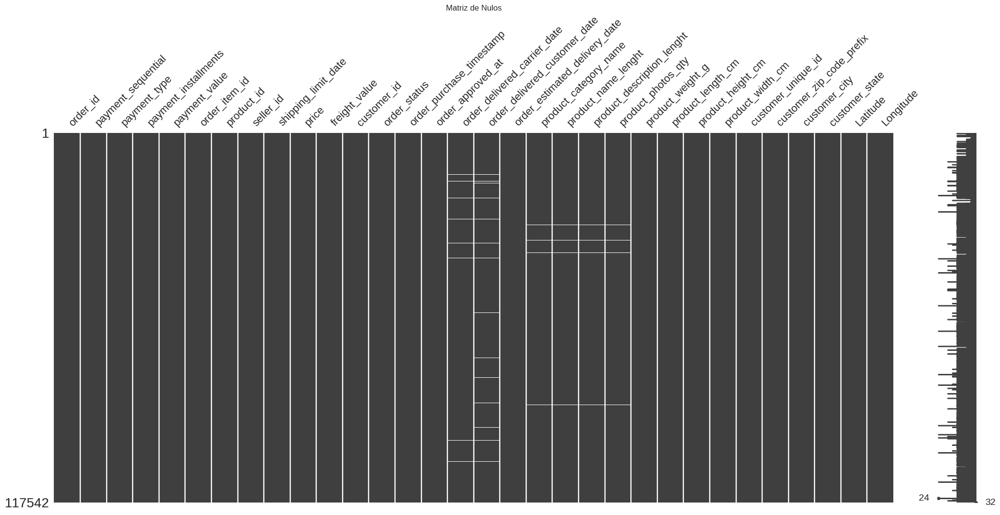

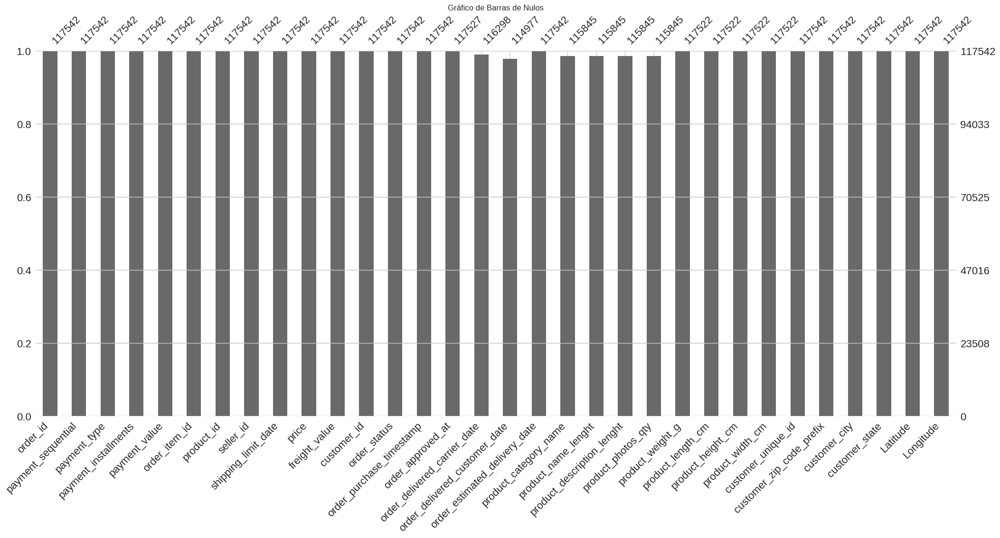

<Figure size 1000x600 with 0 Axes>

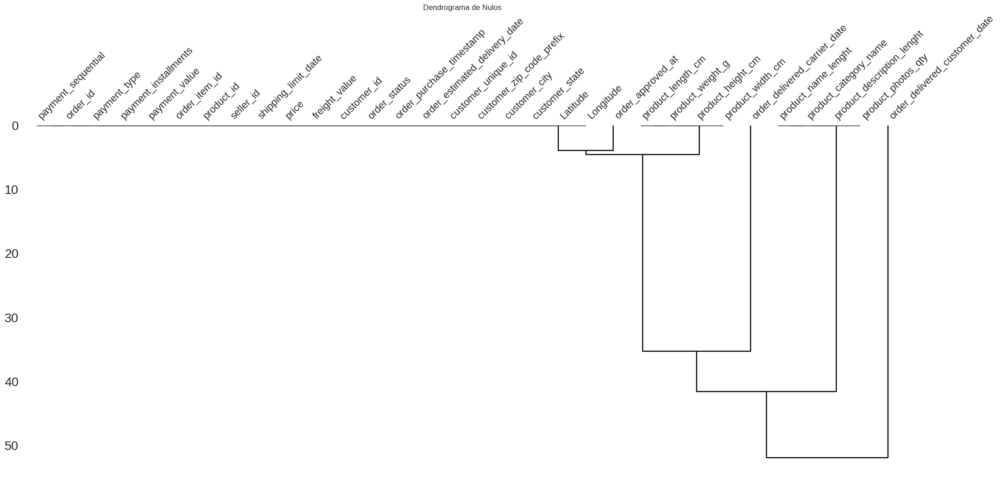

<Figure size 1000x600 with 0 Axes>

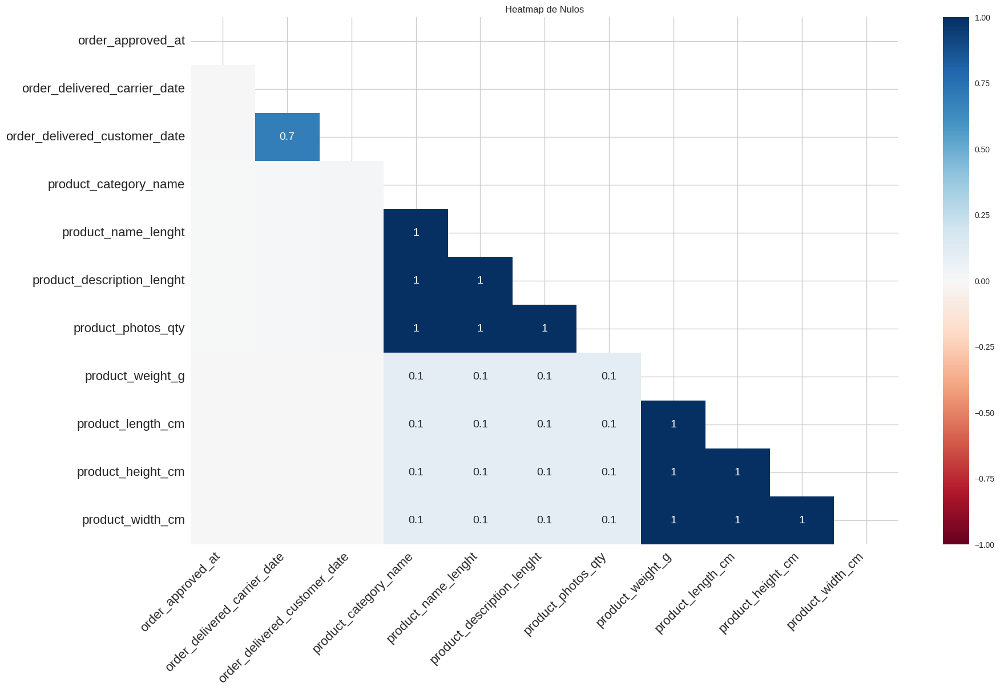

In [36]:
plt.figure(figsize=(10, 6))
msno.matrix(df)
plt.title('Matriz de Nulos')
plt.show()

# Visualização do gráfico de barras
plt.figure(figsize=(10, 6))
msno.bar(df)
plt.title('Gráfico de Barras de Nulos')
plt.show()

# Visualização do dendrograma
plt.figure(figsize=(10, 6))
msno.dendrogram(df)
plt.title('Dendrograma de Nulos')
plt.show()

# Visualização do heatmap
plt.figure(figsize=(10, 6))
msno.heatmap(df)
plt.title('Heatmap de Nulos')
plt.show()

As colunas que contém dados nulos representam no máximo 2% dos dados do dataset, por ser um percentual baixo, optaremos por excluir.Mas poderiamos em outro momento com mais calma analisar as característica e tentar preencher da melhor forma.

In [37]:
df.stb.missing()

,missing,total,percent
order_delivered_customer_date,2565,117542,2.182199
product_photos_qty,1697,117542,1.443739
product_name_lenght,1697,117542,1.443739
product_description_lenght,1697,117542,1.443739
product_category_name,1697,117542,1.443739
order_delivered_carrier_date,1244,117542,1.058345
product_width_cm,20,117542,0.017015
product_length_cm,20,117542,0.017015
product_weight_g,20,117542,0.017015
product_height_cm,20,117542,0.017015


In [38]:
df.dropna(inplace=True)

Checando se os valores nulos foram deletados

In [39]:
df.stb.missing()

,missing,total,percent
order_id,0,113334,0.0
payment_sequential,0,113334,0.0
Latitude,0,113334,0.0
customer_state,0,113334,0.0
customer_city,0,113334,0.0
customer_zip_code_prefix,0,113334,0.0
customer_unique_id,0,113334,0.0
product_width_cm,0,113334,0.0
product_height_cm,0,113334,0.0
product_length_cm,0,113334,0.0


O describe exibe valores estatísticos dos dados como: média,desvio padrão,a divisão dos dados em quartis, o valor máximo e o valor mínimo. Em um cenário  perfeito os dados deveriam se aproximar de uma distribuição normal

In [40]:
df.describe()

,payment_sequential,payment_installments,payment_value,order_item_id,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_zip_code_prefix,Latitude,Longitude
count,113334.000000,113334.000000,113334.000000,113334.00000,113334.000000,113334.000000,113334.000000,113334.000000,113334.000000,113334.000000,113334.000000,113334.000000,113334.000000,113334.000000,113334.000000,113334.000000
mean,1.089964,2.942444,172.253496,1.19694,120.181659,20.020671,48.800422,785.821563,2.209381,2110.466674,30.281795,16.618173,23.099996,35072.611917,-21.167312,-46.414553
std,0.682212,2.777969,266.628604,0.70143,182.763253,15.750596,10.019140,651.047198,1.720285,3770.173108,16.159563,13.447304,11.740751,29844.413606,5.636882,4.378046
min,1.000000,0.000000,0.000000,1.00000,0.850000,0.000000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,1003.000000,-33.688032,-72.601816
25%,1.000000,1.000000,61.000000,1.00000,39.900000,13.080000,42.000000,346.000000,1.000000,300.000000,18.000000,8.000000,15.000000,11310.000000,-23.548157,-48.491412
50%,1.000000,2.000000,108.155000,1.00000,74.900000,16.320000,52.000000,601.000000,1.000000,700.000000,25.000000,13.000000,20.000000,24320.000000,-22.917138,-46.374538
75%,1.000000,4.000000,189.370000,1.00000,133.705000,21.200000,57.000000,985.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,58745.000000,-20.257422,-43.512244
max,26.000000,24.000000,13664.080000,21.00000,6735.000000,409.680000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,99980.000000,42.184003,-8.723762


###Outliers

O boxplot permite analisar se existem valores discrepantes em cada coluna númerica, os famosos outliers. Analisando todas as colunas possuem, e a próxima questão seria como tratá-los? Neste caso por se tratar de valores de produtos não podemos modificar, já que na realidade existem produtos com preços diferentes, bem como a quantidade de vezes que é permitido parcelar.

Um outro cénario que poderia ter sido abordado , a divisão em grupo de preços verificamos que as colunas de preço de de parcelamento são as que mais possuem valores discrepantes

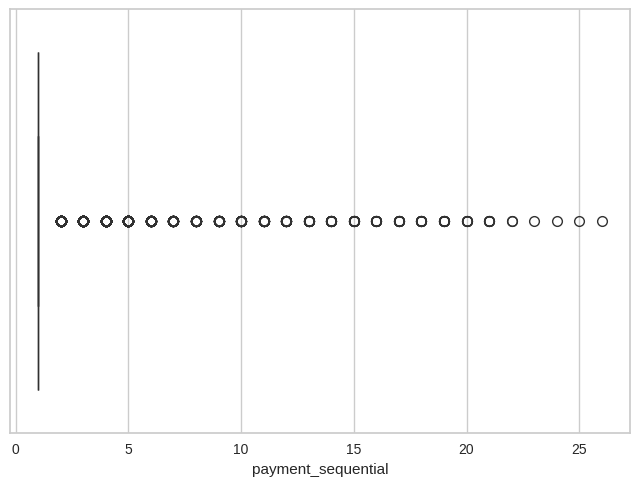

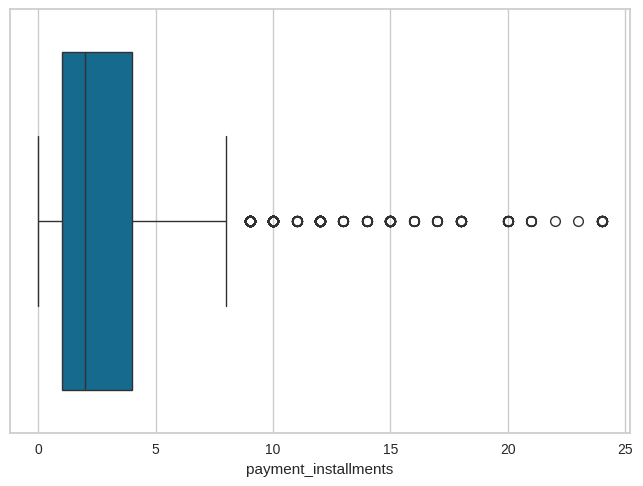

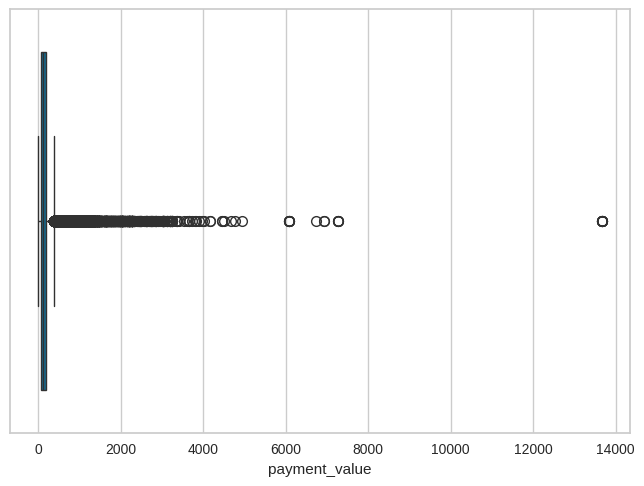

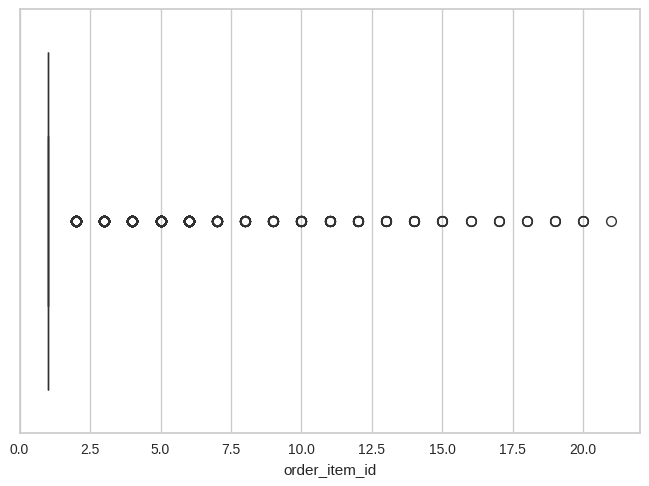

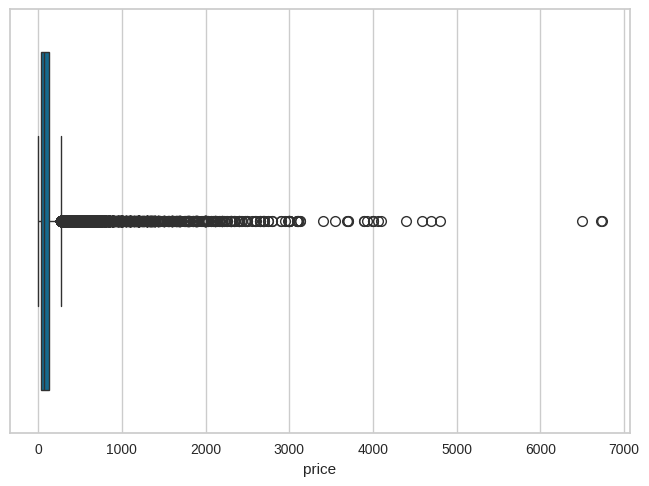

...

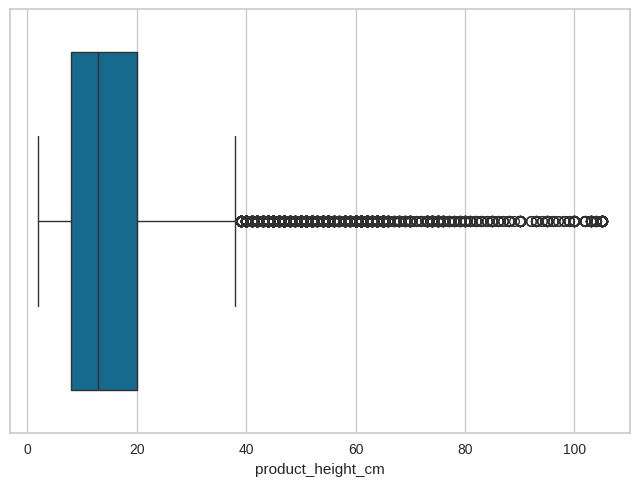

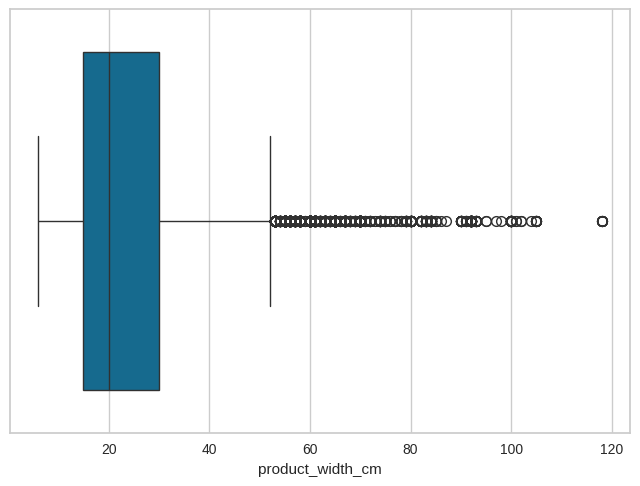

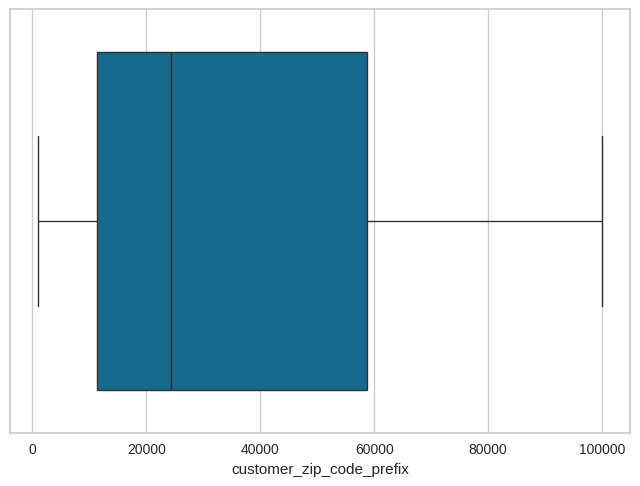

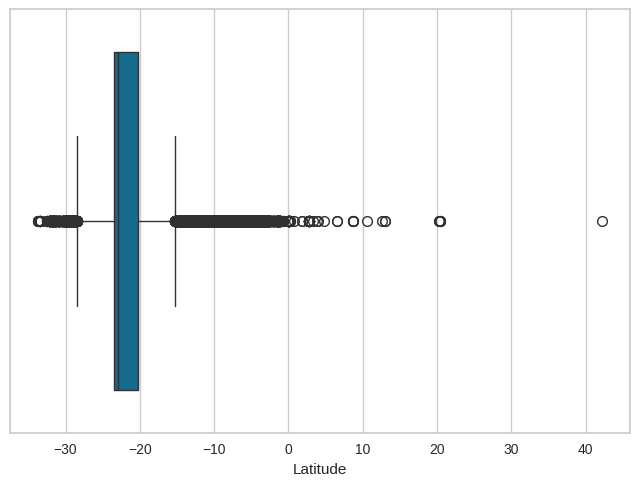

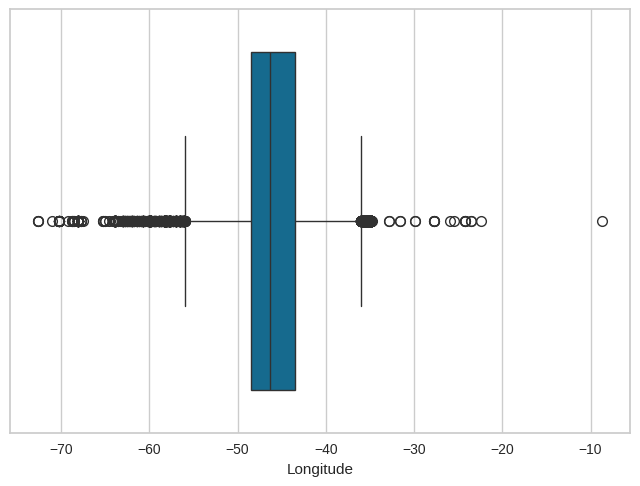

In [41]:
for col in df.select_dtypes(include=np.number).columns:
  sns.boxplot(data=df, x=col)
  plt.show()

##Salvando o dataframe tratado

In [42]:
df.to_csv('olist_completo.csv', index=False)

#Iniciando a análise do perfil dos clientes

Analisando a quantidade de clientes por estado.

In [43]:
clientes_por_estado=df.groupby(by='customer_state').agg({'customer_unique_id':'count'}).sort_values(by='customer_unique_id',ascending=False)
clientes_por_estado.head()

,customer_unique_id
customer_state,
SP,47824
RJ,14641
MG,13226
RS,6280
PR,5781


<ipython-input-44-27ab400a9d31>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=clientes_por_estado, x='customer_unique_id', y='customer_state', palette='viridis')


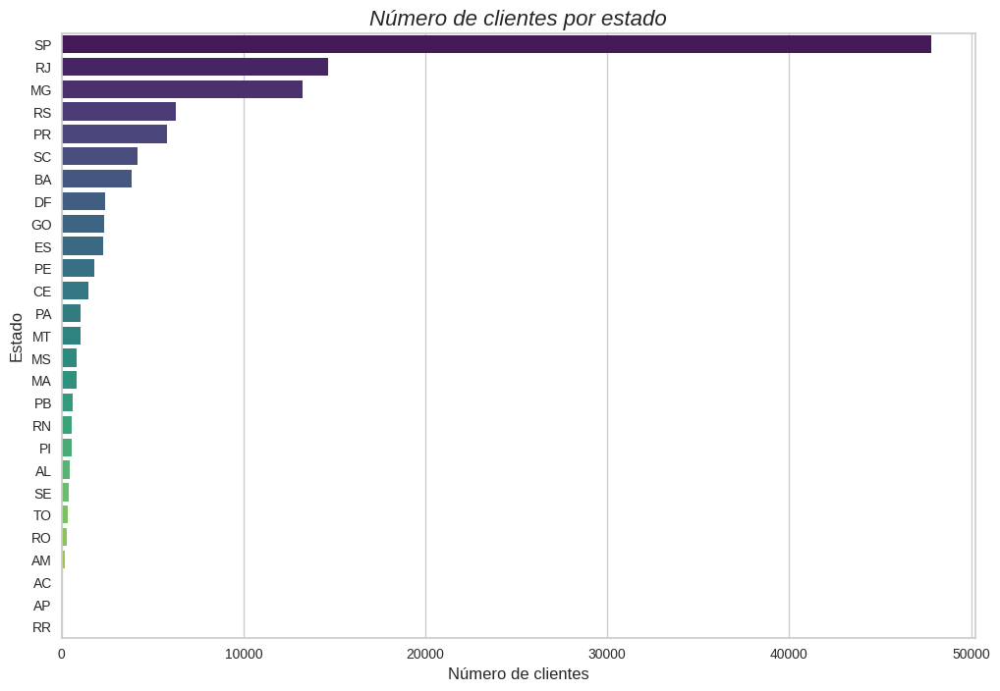

In [44]:
plt.figure(figsize=(12, 8))
sns.barplot(data=clientes_por_estado, x='customer_unique_id', y='customer_state', palette='viridis')
plt.title('Número de clientes por estado', fontsize=16, style='italic')
plt.xlabel('Número de clientes', fontsize=12)
plt.ylabel('Estado', fontsize=12)
plt.show();

<ipython-input-45-03dccf0fc071>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Número de Clientes', y='Cidade', data=clientes_por_cidade, palette='viridis')


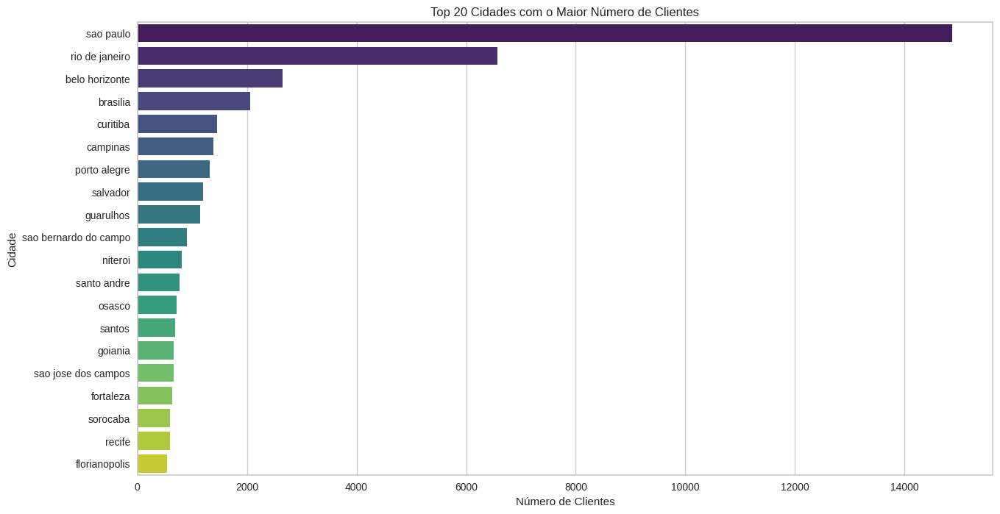

In [45]:
clientes_por_cidade = dados.groupby('customer_city').agg({'customer_unique_id': 'nunique'}).reset_index()
clientes_por_cidade.columns = ['Cidade', 'Número de Clientes']
clientes_por_cidade = clientes_por_cidade.sort_values(by='Número de Clientes', ascending=False).head(20)

plt.figure(figsize=(15, 8))
sns.barplot(x='Número de Clientes', y='Cidade', data=clientes_por_cidade, palette='viridis')
plt.title('Top 20 Cidades com o Maior Número de Clientes')
plt.xlabel('Número de Clientes')
plt.ylabel('Cidade')
plt.show()

O código abaixo mostra as dez categorias mais vendidas. Em primeiro lugar temos: cama mesa e banho, em segundo produtos de limpeza e em terceiro esporte e lazer. O dataset não contém o nome dos produtos, apenas o nome das categorias.

In [46]:
categorias_vendas_volume=df.groupby('product_category_name').agg({'product_id':'count'}).sort_values(by='product_id',ascending=False).head(10)
categorias_vendas_volume

,product_id
product_category_name,
cama_mesa_banho,11645
beleza_saude,9754
esporte_lazer,8728
moveis_decoracao,8551
informatica_acessorios,7896
utilidades_domesticas,7172
relogios_presentes,6059
telefonia,4598
ferramentas_jardim,4459


<ipython-input-47-6d75d419e108>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=categorias_vendas_volume, x='product_id', y=categorias_vendas_volume.index, palette='viridis')


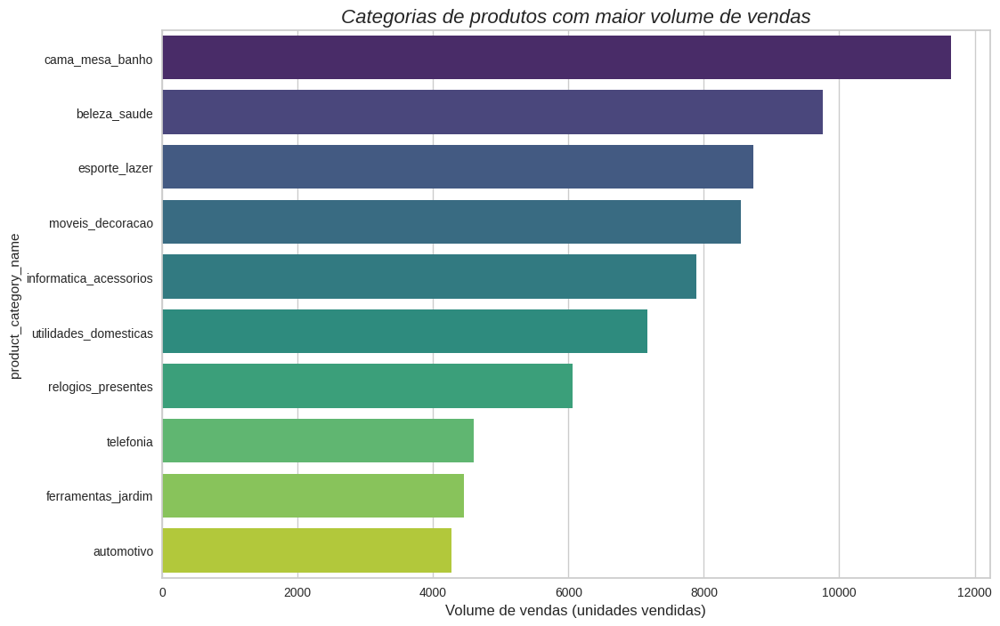

In [47]:
plt.figure(figsize=(12, 8))
sns.barplot(data=categorias_vendas_volume, x='product_id', y=categorias_vendas_volume.index, palette='viridis')
plt.title('Categorias de produtos com maior volume de vendas', fontsize=16, style='italic')
plt.xlabel('Volume de vendas (unidades vendidas)', fontsize=12)
plt.show();

#### Gráfico que exibe a evolução das vendas ao longo do tempo (2016 a 2018)

Podemos observar um aumento constante nas vendas ao longo do tempo, o que indica que a empresa está se consolidando no mercado. A análise ocorreu entre Outubro de 2016 e Julho de 2018

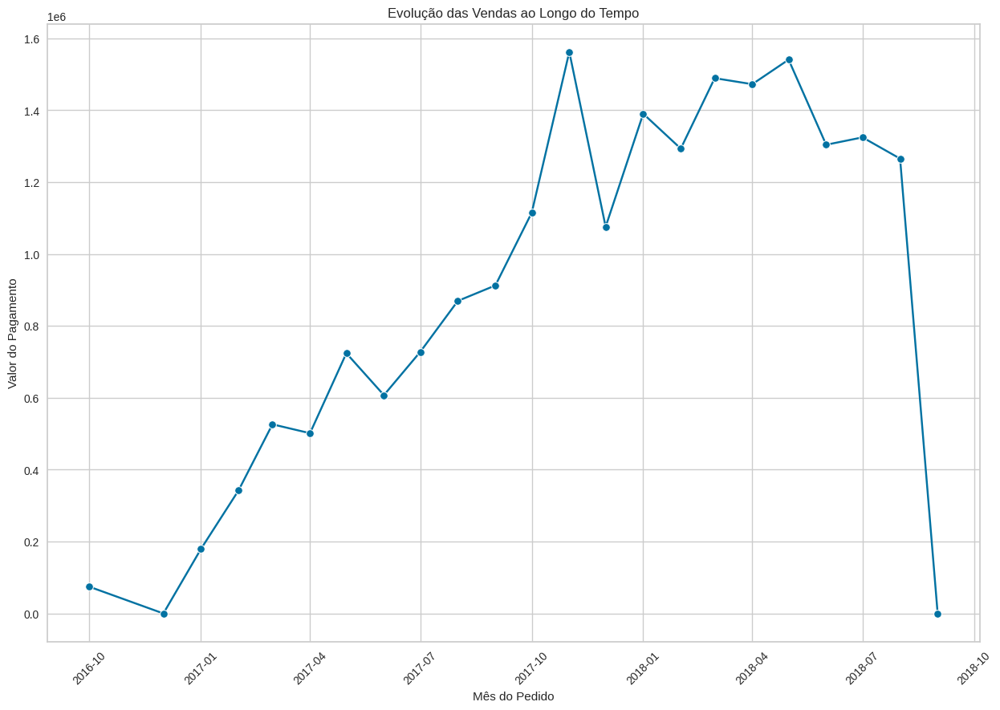

In [48]:
pedidos_aprovados = dados[['order_approved_at', 'payment_value']].dropna(subset=['order_approved_at'])

# Converter a coluna para datetime
pedidos_aprovados['order_approved_at'] = pd.to_datetime(pedidos_aprovados['order_approved_at'])

# Criar colunas para mês e ano
pedidos_aprovados['mes_pedido'] = pedidos_aprovados['order_approved_at'].dt.to_period('M')

# Agrupar por mês e ano e calcular a soma dos valores pagos
media_venda_mes = pedidos_aprovados.groupby('mes_pedido')['payment_value'].sum().reset_index()

# Converter 'mes_pedido' de Period para DateTime para facilitar a plotagem
media_venda_mes['mes_pedido'] = media_venda_mes['mes_pedido'].dt.to_timestamp()

# Plotar o gráfico de linha
plt.figure(figsize=(15, 10))
sns.lineplot(data=media_venda_mes, x='mes_pedido', y='payment_value', marker='o')

plt.title('Evolução das Vendas ao Longo do Tempo')
plt.xlabel('Mês do Pedido')
plt.ylabel('Valor do Pagamento')

plt.xticks(rotation=45)
plt.grid(True)
plt.show()

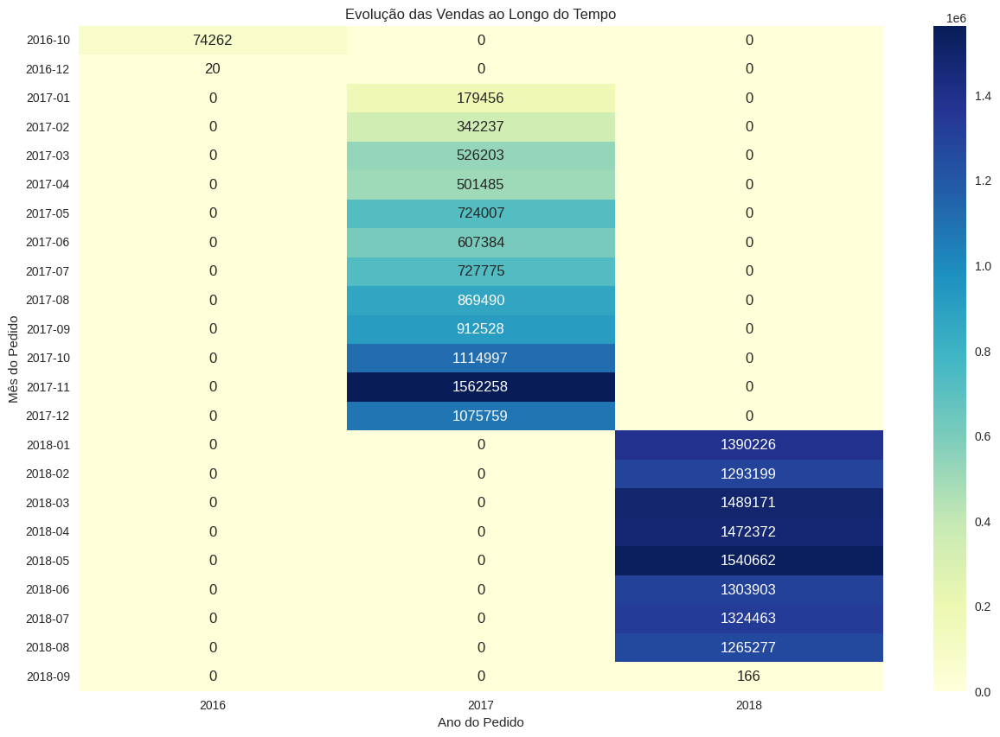

In [52]:
pedidos_aprovados['ano_pedido'] = pedidos_aprovados['order_approved_at'].dt.year
media_venda_ano_mes = pedidos_aprovados.groupby(['ano_pedido', 'mes_pedido'])['payment_value'].sum().unstack('ano_pedido').fillna(0)


media_venda_ano_mes = pedidos_aprovados.groupby(['ano_pedido', 'mes_pedido'])['payment_value'].sum().unstack('ano_pedido').fillna(0)

plt.figure(figsize=(15, 10))
sns.heatmap(media_venda_ano_mes, annot=True, fmt='.0f', cmap='YlGnBu')
plt.title('Evolução das Vendas ao Longo do Tempo')
plt.xlabel('Ano do Pedido')
plt.ylabel('Mês do Pedido')
plt.show()

#### Categorias de produtos com maior receita

In [50]:
categorias_maior_receita = df.groupby(by='product_category_name').agg({'payment_value':'sum'}).sort_values(by='payment_value',ascending=False).head(10)
categorias_maior_receita

,payment_value
product_category_name,
cama_mesa_banho,1692117.99
beleza_saude,1620224.49
informatica_acessorios,1549097.61
moveis_decoracao,1393855.80
relogios_presentes,1385809.09
esporte_lazer,1348944.27
utilidades_domesticas,1069787.97
automotivo,832883.40
ferramentas_jardim,808898.84


<ipython-input-51-45466e1e7d16>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=categorias_maior_receita, x='payment_value', y=categorias_maior_receita.index, palette='viridis')


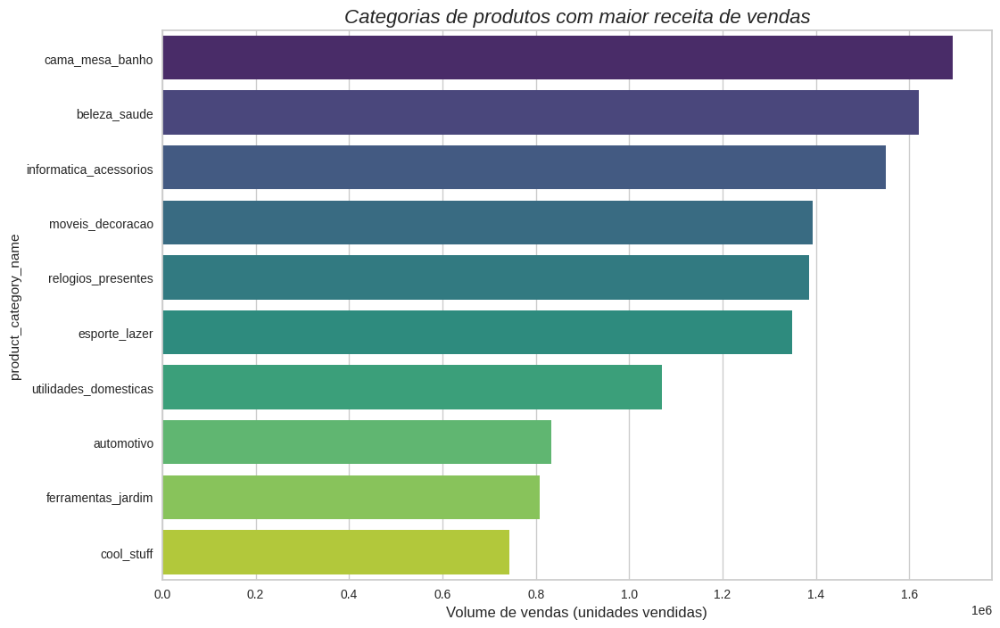

In [51]:
plt.figure(figsize=(12, 8))
sns.barplot(data=categorias_maior_receita, x='payment_value', y=categorias_maior_receita.index, palette='viridis')
plt.title('Categorias de produtos com maior receita de vendas', fontsize=16, style='italic')
plt.xlabel('Volume de vendas (unidades vendidas)', fontsize=12)
plt.show();



#### Quais são os estados com maior número de vendas e qual o seu valor médio de frete?


In [53]:
agrupamento_estado = df.groupby('customer_state')

# 2. Conte o número de vendas únicas para cada estado
qtd_vendas_por_estado = agrupamento_estado['order_id'].nunique()

# 3. Calcule a média do valor do frete por venda para cada estado
media_frete_por_estado = agrupamento_estado['freight_value'].sum() / qtd_vendas_por_estado

# Crie um novo DataFrame com os resultados
resultado = pd.DataFrame({
    'estado': qtd_vendas_por_estado.index,
    'qtd_vendas': qtd_vendas_por_estado.values,
    'media_frete': media_frete_por_estado.values
})

# Se necessário, você pode arredondar a média do frete para duas casas decimais
resultado['media_frete'] = resultado['media_frete'].round(2)


In [54]:
resultado.sort_values(by='qtd_vendas', ascending=False)

,estado,qtd_vendas,media_frete
25,SP,39945,18.19
18,RJ,12159,25.41
10,MG,11180,24.45
22,RS,5263,25.90
17,PR,4847,24.54
23,SC,3492,25.64
4,BA,3211,31.44
6,DF,2050,24.67
7,ES,1977,25.45
8,GO,1909,27.45


Onde tem um número maior de vendas, o frete se torna menor.

### Vendas por método de pagamento

Nesta parte é possível identificar as formas de pagamento mais comuns. Em primeiro lugar, temos o cartão de crédito, seguido pelo boleto. Surpreendentemente, o voucher ocupa a terceira posição, e, por último, está o cartão de débito. Isso fornece uma visão sobre os métodos de pagamento mais populares e seu impacto financeiro nos dados analisados.

In [55]:
metodo_pagamento = df.groupby('payment_type').agg({'payment_value':'sum'}).sort_values(by='payment_value',ascending=False)
metodo_pagamento

,payment_value
payment_type,
credit_card,15005033.40
boleto,3885306.50
voucher,388890.15
debit_card,242947.63


In [56]:
df['payment_type'].value_counts(normalize=True)

payment_type
credit_card    0.738207
boleto         0.194434
voucher        0.053029
debit_card     0.014329
Name: proportion, dtype: float64

#### Vamos analisar por estado.

In [57]:
pagamento_por_estado = df.groupby(['customer_state', 'payment_type']).size().reset_index(name='count')
pagamento_por_estado.sort_values(by='count', ascending=False)

,customer_state,payment_type,count
98,SP,credit_card,35234
72,RJ,credit_card,11108
40,MG,credit_card,9844
97,SP,boleto,9156
86,RS,credit_card,4385
...,...,...,...
14,AP,voucher,3
6,AL,debit_card,3
10,AM,debit_card,2
2,AC,debit_card,2


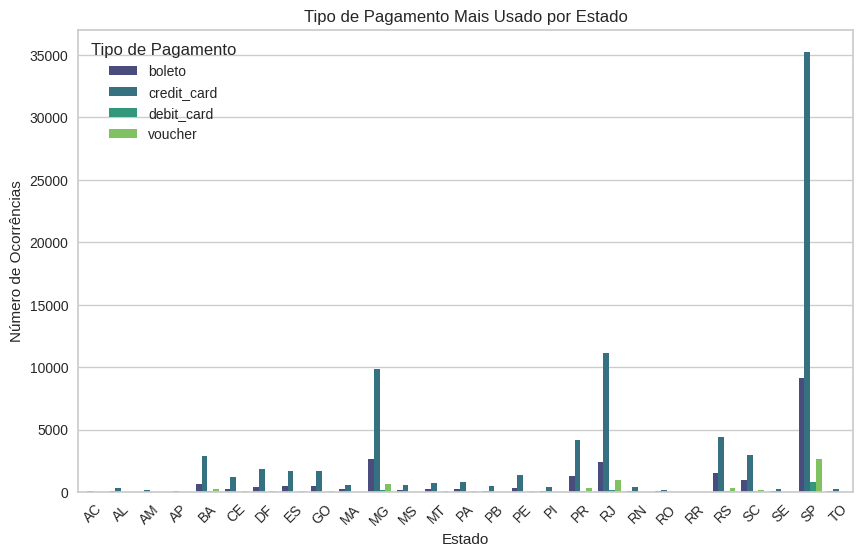

In [58]:
plt.figure(figsize=(10, 6))
sns.barplot(data=pagamento_por_estado, x='customer_state', y='count', hue='payment_type', palette='viridis')
plt.title('Tipo de Pagamento Mais Usado por Estado')
plt.xlabel('Estado')
plt.ylabel('Número de Ocorrências')
plt.legend(title='Tipo de Pagamento')
plt.xticks(rotation=45)
plt.show()

#### Dentre os 27 estados, incluindo o Distrito Federal, a forma de pagamento mais utilizada é o cartão de crédito

##Analisando a quantidade de parcelamentos

O unico método que permite parcelamento neste dataset, é o cartão de crédito, e o números de parcelas varia de 0 (que seria pagamento a vista) a 23 prestações.

In [59]:
dados_cartao_credito=df[df['payment_type']=='credit_card']
dados_cartao_credito.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,...,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,Latitude,Longitude
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,...,800.0,17.0,27.0,17.0,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG,-17.756379,-41.486759
9,c05a5defefe139269bfc13a22fbe8543,1,credit_card,6,133.17,1,53b36df67ebb7c41585e8d54d6772e08,58f1a6197ed863543e0136bdedb3fce2,2018-07-13 18:55:13,119.00,...,584.0,16.0,11.0,13.0,65dc7b434112b1871ffba93a74a65b5d,39801,teofilo otoni,MG,-17.756379,-41.486759
10,9aee4ebad2ec4e0ac243cfd62de682e7,1,credit_card,10,103.86,1,dbb4ce89c8ed5fb6fd901e2e51093179,91f848e9f4be368f4318775aac733370,2017-03-23 08:00:10,84.99,...,2200.0,48.0,25.0,25.0,7ff4407ed5e944756d542c3782fb6ad4,39804,teofilo otoni,MG,-17.756379,-41.486759
11,8543d2d86c69647af5e2d957c3d21b85,1,credit_card,2,92.99,1,d86963242e7dda7eed04f57e492ed655,a3a38f4affed601eb87a97788c949667,2017-10-11 16:14:26,74.90,...,1100.0,43.0,6.0,30.0,bf7ff38191f28b19f5b2074480c5b1d9,39803,teofilo otoni,MG,-17.756379,-41.486759
12,acefa886e54be2156f0d139a106d063e,1,credit_card,2,69.54,1,952e73f7e8bee61569a32b35c19bc981,7ad32824caee82087b3e2e5f33b1bf32,2018-06-27 17:58:15,50.00,...,950.0,50.0,5.0,50.0,e14ca0043a1e7d28de82c799f9053f64,39800,teofilo otoni,MG,-17.756379,-41.486759


In [60]:
dados_cartao_credito['payment_installments'].value_counts()

payment_installments
1     26802
2     13188
3     11326
4      7710
10     6630
5      5823
8      4867
6      4454
7      1741
9       701
12      160
15       89
18       38
24       34
11       25
20       20
13       17
14       15
16        7
17        7
21        5
0         3
23        1
22        1
Name: count, dtype: int64

In [61]:
dados_cartao_credito.groupby('customer_state')['payment_installments'].mean().reset_index()

,customer_state,payment_installments
0,AC,4.579710
1,AL,4.617564
2,AM,3.873134
3,AP,3.438596
4,BA,4.124825
5,CE,4.309871
6,DF,3.373384
7,ES,3.733967
8,GO,3.923714
9,MA,4.090744


#### A média de parcelamento para cada estado varia de 3 a 5 parcelas.

In [62]:
(dados_cartao_credito.groupby(['customer_state','customer_city','payment_installments'])['payment_installments'].size()).to_frame(name='count').sort_values(by='payment_installments', ascending=False)

,,,count
customer_state,customer_city,payment_installments,
CE,iguatu,24,1
RS,porto alegre,24,2
RJ,rio de janeiro,24,1
PR,assai,24,1
SP,guaruja,24,2
...,...,...,...
MG,lagoa grande,1,1
BA,teixeira de freitas,1,7
RS,capao do cipo,1,1


#### Analisando os Estados que mais parcelam

In [63]:
# Agrupar e somar os dados
dados_grafico = (dados_cartao_credito.groupby(['customer_state', 'payment_installments'])['payment_installments']
                 .sum()
                 .reset_index(name='count')
                 .sort_values(by='count', ascending=False))

total_count_por_state = dados_grafico.groupby('customer_state')['count'].transform('sum')

# Cria uma nova coluna onde mostra o percentual de parcelamentos por região
dados_grafico['percentage'] = (dados_grafico['count'] / total_count_por_state * 100).round(2)

dados_grafico

,customer_state,payment_installments,count,percentage
342,SP,10,22350,19.10
340,SP,8,14632,12.51
335,SP,3,13806,11.80
333,SP,1,12891,11.02
334,SP,2,11724,10.02
...,...,...,...,...
280,RR,1,7,5.65
285,RR,6,6,4.84
283,RR,4,4,3.23
39,BA,0,0,0.00


<Figure size 1400x1000 with 0 Axes>

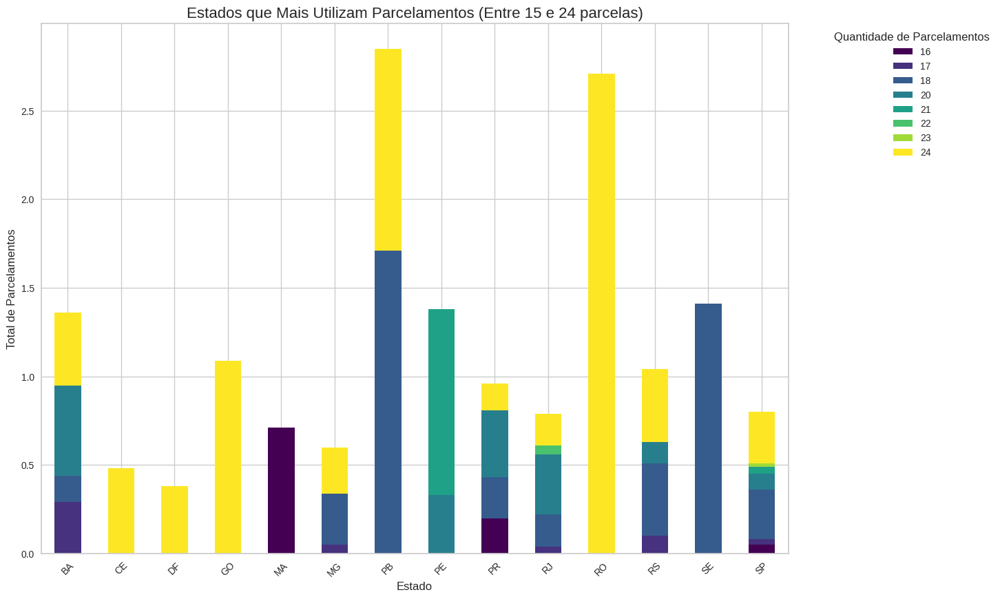

In [65]:
# Analisando os estados que mais parcelam
dados_com_mais_15_parcelas = dados_grafico[dados_grafico['payment_installments'] > 15]

# Reorganizar os dados para um gráfico de barras empilhadas
dados_pivot = dados_com_mais_15_parcelas.pivot(index='customer_state', columns='payment_installments', values='percentage').fillna(0)

# Plotar o gráfico de barras empilhadas
plt.figure(figsize=(14, 10))
dados_pivot.plot(kind='bar', stacked=True, colormap='viridis', figsize=(14, 10))

# Adicionar título e rótulos
plt.title('Estados que Mais Utilizam Parcelamentos (Entre 15 e 24 parcelas)', fontsize=16)
plt.xlabel('Estado', fontsize=12)
plt.ylabel('Total de Parcelamentos', fontsize=12)
plt.xticks(rotation=45)

# Adicionar legenda
plt.legend(title='Quantidade de Parcelamentos', bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar o gráfico
plt.show()

###Analisando a média de parcelamentos em cada cidade, em cidades pequenas a quantidade de parcelamentos é maior.

In [68]:
agrupamento_por_estado=(dados_cartao_credito.groupby(['customer_state', 'customer_city','payment_type']).agg({'payment_installments': 'mean'}))
agrupamento_por_estado.sort_values(by='payment_installments', ascending=False)

,,,payment_installments
customer_state,customer_city,payment_type,
BA,quijingue,credit_card,14.0
GO,ipiranga de goias,credit_card,14.0
PA,murucupi,credit_card,12.0
MG,sao pedro da uniao,credit_card,12.0
MA,sao bernardo,credit_card,12.0
...,...,...,...
SC,ponte alta do norte,credit_card,1.0
MS,gloria de dourados,credit_card,1.0
CE,pires ferreira,credit_card,1.0


##Estudo por Regiões

In [69]:
sudeste = ['SP', 'RJ', 'MG', 'ES']
sul = ['PR', 'SC', 'RS']
nordeste = ['BA', 'SE', 'AL', 'PE', 'PB', 'RN', 'CE', 'PI', 'MA']
centro_oeste = ['DF', 'GO', 'MT', 'MS']
norte = ['AC', 'AP', 'AM', 'PA', 'RO', 'RR', 'TO']

# Função para mapear estados para suas regiões
def mapear_regiao(estado):
    if estado in sudeste:
        return 'Sudeste'
    elif estado in sul:
        return 'Sul'
    elif estado in nordeste:
        return 'Nordeste'
    elif estado in centro_oeste:
        return 'Centro-Oeste'
    elif estado in norte:
        return 'Norte'
    else:
        return 'Desconhecido'  # Caso o estado não esteja em nenhuma lista

df['regiao'] = df['customer_state'].apply(mapear_regiao)

In [70]:
df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,...,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,Latitude,Longitude,regiao
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.8,...,17.0,27.0,17.0,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
1,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,1,389d119b48cf3043d311335e499d9c6b,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,37.0,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
2,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,3,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,37.0,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
3,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,4,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,37.0,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
4,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,2,774e21c631ca26cba7b5606bdca7460f,382229d1e840115ffe3dbf5ff460e417,2018-05-28 09:14:33,39.9,...,20.0,4.0,21.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste


Número de clientes por região , respeita a mesma proporção da divisão por estado

In [74]:
df.groupby('regiao').agg({'customer_unique_id':'count'}).sort_values(by='customer_unique_id',ascending=False)

,customer_unique_id
regiao,
Sudeste,77978
Sul,16222
Nordeste,10473
Centro-Oeste,6599
Norte,2062


In [72]:
df['regiao'].value_counts(normalize=True)

regiao
Sudeste         0.688037
Sul             0.143134
Nordeste        0.092408
Centro-Oeste    0.058226
Norte           0.018194
Name: proportion, dtype: float64

In [75]:
vendas_por_regiao=df.groupby('regiao').agg({'payment_value':'sum'})
vendas_por_regiao['% Vendas'] = vendas_por_regiao['payment_value'].apply(lambda x: round((x / sum(vendas_por_regiao['payment_value'])),4) * 100)
vendas_por_regiao.sort_values(by='payment_value',ascending=False)

,payment_value,% Vendas
regiao,,
Sudeste,12622301.38,64.66
Sul,2868214.76,14.69
Nordeste,2248337.40,11.52
Centro-Oeste,1313044.77,6.73
Norte,470279.37,2.41


Analisar apenas o número bruto de compras por região pode ser enganoso porque não leva em conta a população de cada região. Regiões mais populosas naturalmente terão mais compras. Para obter uma análise mais justa e representativa, iremos calcular as vendas per capita, ou seja, o número de vendas em relação à população da região.

https://mundoeducacao.uol.com.br/geografia/populacao-brasileira.htm. Neste site consta a população por região do ano de 2022, vamos usar estes dados para analisar o comportamento.

In [76]:
populacao_por_regiao={
    'Sudeste':84847187,
    'Nordeste':54644582,
    'Sul':29933315,
    'Norte':17349619,
    'Centro-Oeste':16287809
}

vendas_por_regiao['Populacao'] = vendas_por_regiao.index.map(populacao_por_regiao)
vendas_por_regiao['Vendas por Habitante'] = vendas_por_regiao['payment_value'] / vendas_por_regiao['Populacao']
vendas_por_regiao.sort_values(by='payment_value',ascending=False)


,payment_value,% Vendas,Populacao,Vendas por Habitante
regiao,,,,
Sudeste,12622301.38,64.66,84847187,0.148765
Sul,2868214.76,14.69,29933315,0.095820
Nordeste,2248337.40,11.52,54644582,0.041145
Centro-Oeste,1313044.77,6.73,16287809,0.080615
Norte,470279.37,2.41,17349619,0.027106


Nessa análise ainda é notavel que as Regiões Sudeste e Sul possuem um volume grande de compras.

####Parcelamento por região

         regiao  media_parcelamentos
0  Centro-Oeste             3.023034
1      Nordeste             3.470448
2         Norte             3.310863
3       Sudeste             2.839596
4           Sul             3.016336


<ipython-input-77-8cc8be7b198b>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=parcelamentos_por_regiao, x='regiao', y='media_parcelamentos', palette='viridis')


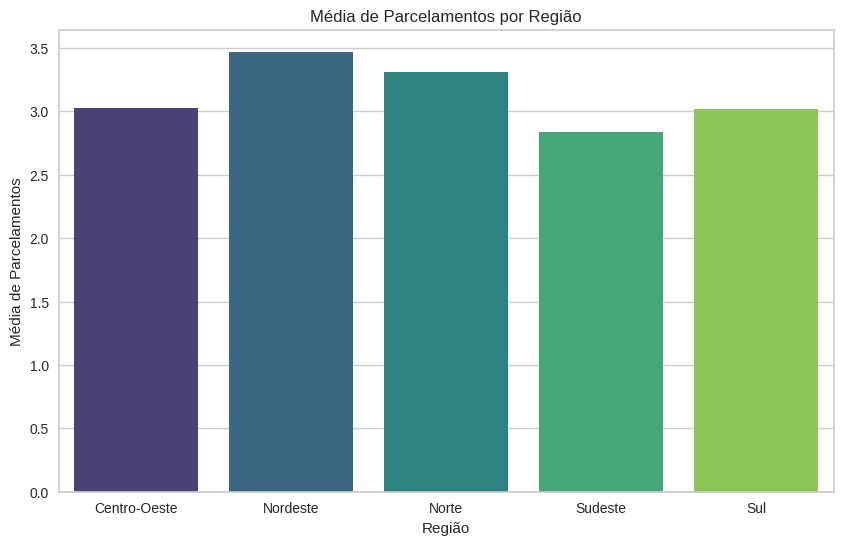

In [77]:
parcelamentos_por_regiao = df.groupby('regiao')['payment_installments'].mean().reset_index()

# Renomear a coluna para algo mais descritivo
parcelamentos_por_regiao.rename(columns={'payment_installments': 'media_parcelamentos'}, inplace=True)

# Exibir o DataFrame resultante
print(parcelamentos_por_regiao)

# Plotar os resultados usando Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(data=parcelamentos_por_regiao, x='regiao', y='media_parcelamentos', palette='viridis')
plt.title('Média de Parcelamentos por Região')
plt.xlabel('Região')
plt.ylabel('Média de Parcelamentos')
plt.show()

In [78]:
distribuicao_parcelamentos = df.groupby(['regiao', 'payment_installments']).size().reset_index(name='count')
distribuicao_parcelamentos.sort_values(by='payment_installments', ascending=False)

,regiao,payment_installments,count
93,Sul,24,4
73,Sudeste,24,21
35,Nordeste,24,4
49,Norte,24,1
14,Centro-Oeste,24,4
...,...,...,...
51,Sudeste,1,39796
74,Sul,1,8240
0,Centro-Oeste,1,3175
15,Nordeste,0,2


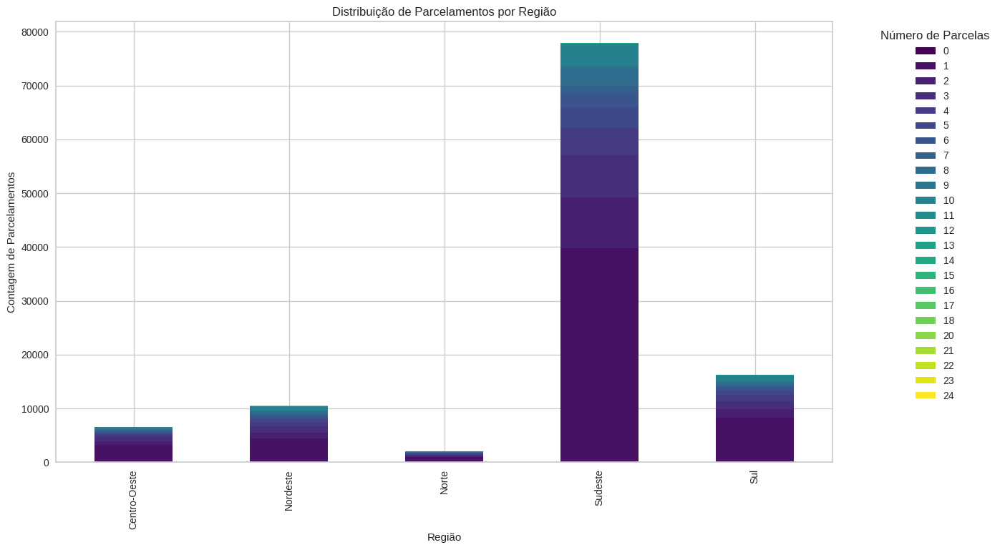

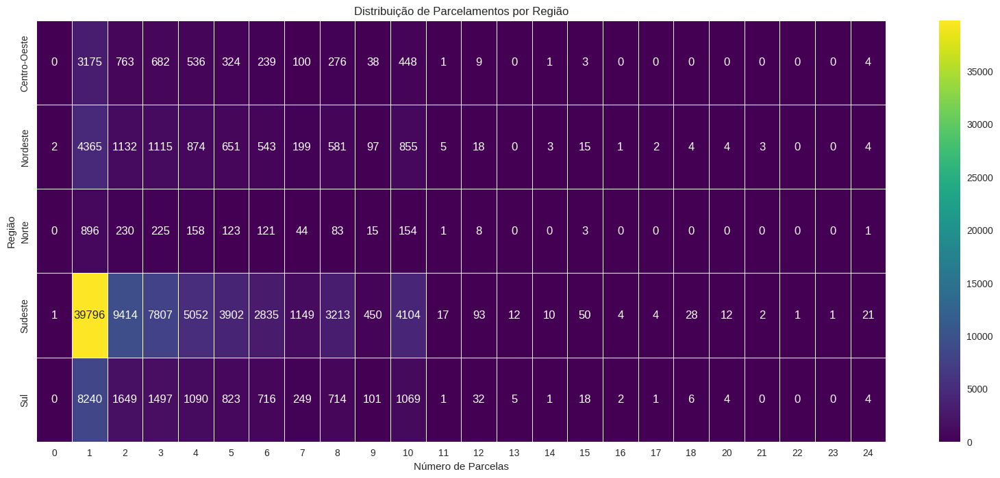

In [79]:
pivot_data = distribuicao_parcelamentos.pivot(index='regiao', columns='payment_installments', values='count').fillna(0)

# Plotar o gráfico de barras empilhadas
pivot_data.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='viridis')
plt.title('Distribuição de Parcelamentos por Região')
plt.xlabel('Região')
plt.ylabel('Contagem de Parcelamentos')
plt.legend(title='Número de Parcelas', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Plotar o gráfico de calor (heatmap)
plt.figure(figsize=(20, 8))
sns.heatmap(pivot_data, annot=True, fmt='g', cmap='viridis', linewidths=.5)
plt.title('Distribuição de Parcelamentos por Região')
plt.xlabel('Número de Parcelas')
plt.ylabel('Região')
plt.show()

#### Nota-se que cada região apresenta uma distribuição de quantidade de parcelamentos semelhante às demais.

###Cálculo do Ticket-médio

O termo "ticket médio" é uma métrica usada em negócios e vendas para representar o valor médio das transações realizadas por clientes. Em outras palavras, o ticket médio é o valor médio que cada cliente gasta em uma compra.

Para calcular o ticket médio, você divide o total das vendas pelo número total de transações.

O ticket médio é uma métrica importante para entender o comportamento de compra dos clientes e pode ajudar a orientar estratégias de precificação, marketing e gerenciamento de produtos. Um ticket médio mais alto geralmente indica que os clientes estão gastando mais em cada compra, o que pode ser um sinal de lealdade do cliente ou de sucesso em estratégias de venda cruzada e upselling. Por outro lado, um ticket médio baixo pode indicar que os clientes estão gastando menos em média, o que pode exigir a revisão das estratégias de vendas e marketing.

In [81]:
ticket_medio_regiao = df.groupby('regiao')['payment_value'].mean()
ticket_medio_regiao.to_frame()

,payment_value
regiao,
Centro-Oeste,198.976325
Nordeste,214.679404
Norte,228.069530
Sudeste,161.870032
Sul,176.810181


In [87]:
copiaprateste = df.copy()

In [88]:
copiaprateste['Ticket médio região'] = pd.merge(copiaprateste, ticket_medio_regiao, on='regiao')

ValueError: Cannot set a DataFrame with multiple columns to the single column Ticket médio região

In [82]:
ticket_medio_estado = df.groupby(['regiao', 'customer_state'])['payment_value'].mean()
ticket_medio_estado.to_frame()

payment_value
regiao       customer_state               
Centro-Oeste DF                 174.984981
             GO                 208.364294
             MS                 196.092191
             MT                 234.539297
Nordeste     AL                 246.681216
             BA                 197.592674
             CE                 220.846939
             MA                 238.814373
             PB                 282.213448
             PE                 196.939068
             PI                 243.239231
             RN                 206.204250
             SE                 222.794386
Norte        AC                 269.164674
             AM                 198.956407
             AP                 259.297711
             PA                 228.975275
             RO                 233.751709
             RR                 249.978636
             TO                 212.895424
Sudeste      ES                 173.283878
             MG                 170.659536
             RJ                 181.427583
             SP                 152.906007
Sul          PR                 176.355729
             RS                 173.566365
             SC                 182.337304

Inserindo a coluna de Ticket médio por região no dataset original.

In [93]:
df['ticket_medio'] = df.groupby(['regiao'])['payment_value'].transform('mean')

Analisando o ticket médio temos uma reviravolta nos insights dos dados, pois os clientes que mais gastam não estão na regiões com maior volume de vendas. Já que aqui estamos analisando o valor das compras e não só o volume de pedidos.

### Unindo os pontos análisados

- O período analisado compreende os dados de Outubro de 2016 a Julho de 2018;

- A maioria dos registros está concentrada na região Sudeste (64,66%), com uma significativa presença no estado de São Paulo;

- As categorias "cama_mesa_banho", "beleza_saude", "moveis_decoracao" possuem o maior volume de vendas e as maiores receitas;

- Existe uma tendência de redução no valor do frete à medida que o volume de vendas estadual aumenta;

- Mais de 70% dos pedidos, em todos os Estados, são pagos por cartão de crédito;

- A média de parcelamento das compras varia de 3 a 5 parcelas na maioria dos estados, sendo maior em cidades menores;

- Cada região apresenta uma distribuição semelhante na quantidade de parcelamento;

- Os estados com os maiores ticket-médios não coincidem com aqueles de maior volume de vendas.

###Colunas no dataset

Vamos analisar a relação das variáveis existentes para iniciar uma modelagem de Machine Learning para analisar o perfil de clientes.

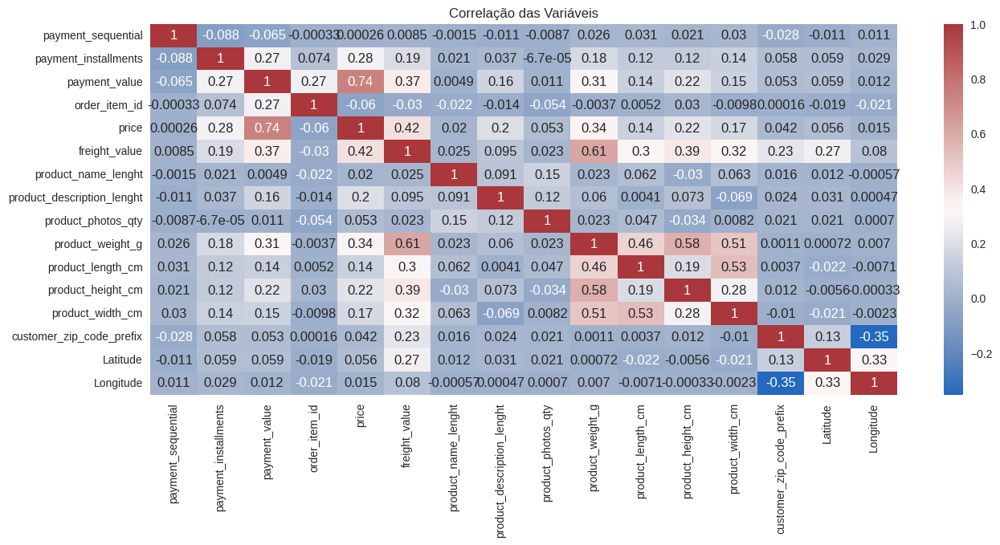

In [83]:
var_num=df.describe().columns.tolist()
plt.figure(figsize=(15,6))
sns.heatmap(data=df[var_num].corr(), annot=True, cmap="vlag")
plt.title("Correlação das Variáveis")
plt.show()

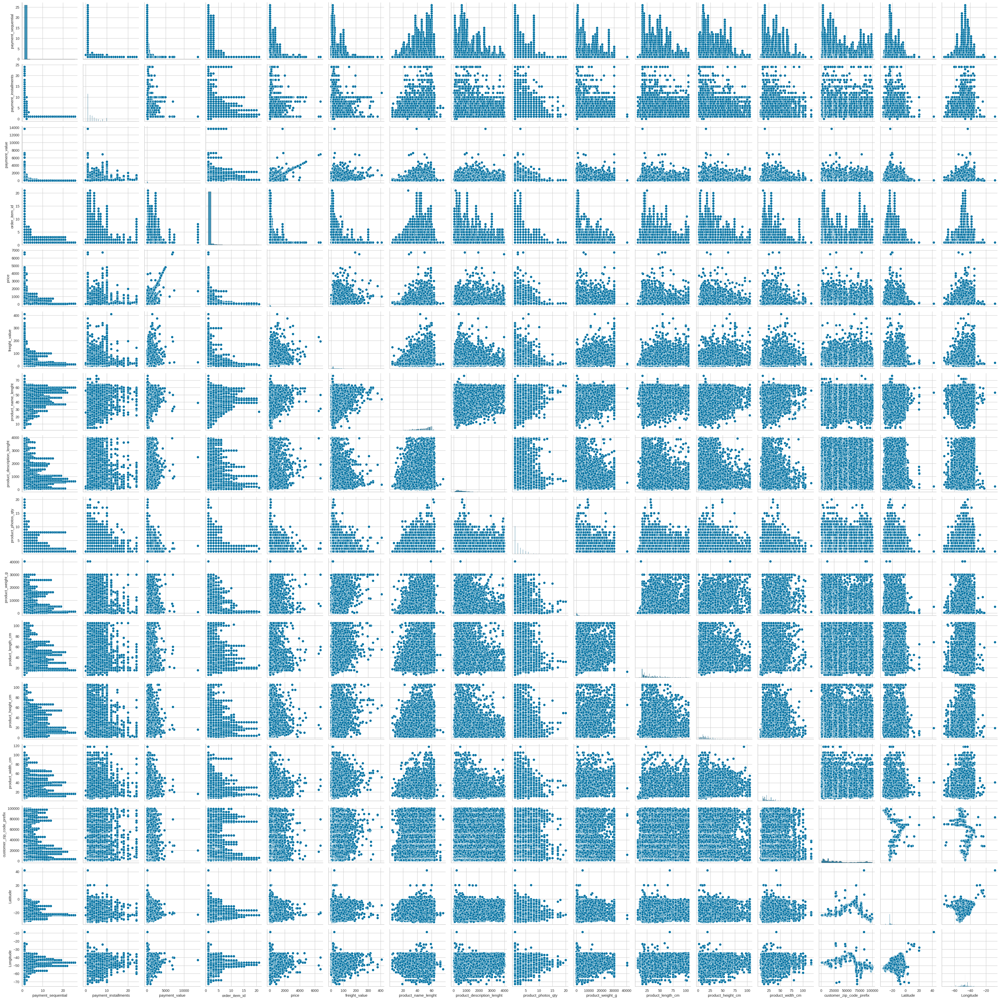

In [ ]:
sns.pairplot(df)

#K-MEANS

Usar encoders para transformar variáveis categóricas em valores numéricos é uma prática comum na preparação de dados para algoritmos de machine learning, incluindo K-means. No entanto, essa abordagem pode introduzir alguns problemas e perigos específicos quando se trata de clustering com K-means. Aqui estão alguns dos principais perigos:
1. Ordem Arbitrária:Encoders como LabelEncoder atribuem números inteiros a categorias de forma arbitrária. Isso pode introduzir uma ordem artificial nos dados, onde nenhuma relação ordinal existe.
Impacto:
K-means utiliza distâncias euclidianas para determinar a similaridade entre pontos de dados. Se categorias diferentes receberem valores numéricos arbitrários, a distância calculada entre pontos pode não refletir a verdadeira similaridade entre as categorias.
2. Escala de Valores:Os valores numéricos atribuídos a categorias podem ter escalas muito diferentes. Por exemplo, se uma categoria é mapeada para 1 e outra para 100, isso pode distorcer o cálculo das distâncias.
Impacto:
K-means pode dar importância desproporcional às categorias com valores maiores, afetando a formação de clusters.
3. Dimensionalidade Alta:Métodos como OneHotEncoder aumentam a dimensionalidade do dataset ao criar uma nova coluna para cada categoria.
Impacto:
A alta dimensionalidade pode levar à "maldição da dimensionalidade", onde a distância entre os pontos se torna menos significativa. Isso pode dificultar a formação de clusters coesos.
4. Perda de Informação Semântica:Encoders não capturam a semântica das categorias. Duas categorias que são semanticamente próximas podem ser mapeadas para valores muito diferentes.
Impacto:
Isso pode levar a uma representação ineficaz das relações entre categorias no espaço de características.

###K-means + PCA + StandardScaler

In [95]:
dados_filtrados = df.copy()

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


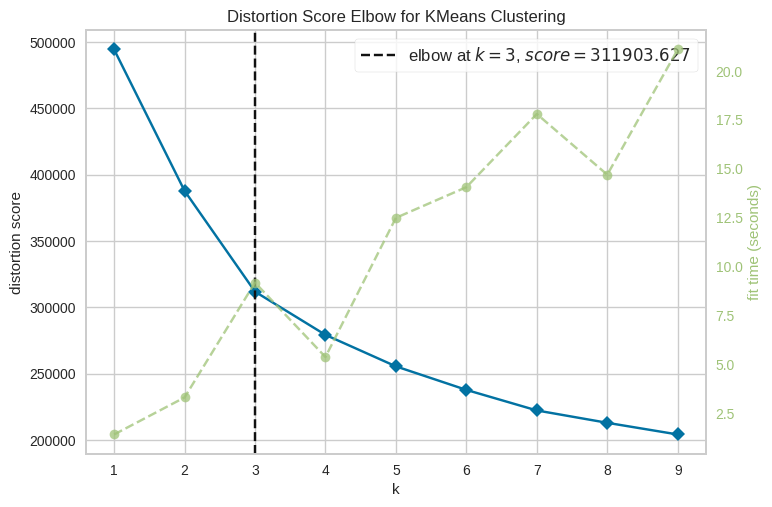

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Silhouette Score for K-means: 0.29389047475529967


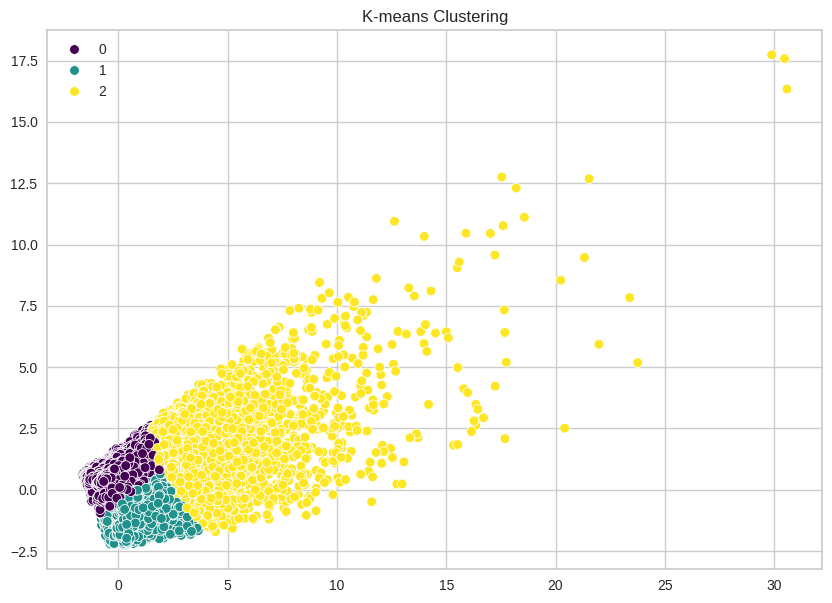

In [103]:
# Seleção das features
features = dados_filtrados[['price', 'freight_value', 'payment_type', 'product_category_name', 'customer_zip_code_prefix']]

# Definição das features categóricas e numéricas
categorical_features = ['payment_type', 'product_category_name']
numerical_features = ['price', 'freight_value', 'customer_zip_code_prefix']

# Criação do ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(sparse=False), categorical_features)  # Definimos sparse=False aqui
    ]
)

# Transformar as features
features_transformed = preprocessor.fit_transform(features)

# Ajuste e visualização do KElbowVisualizer
modelo = KMeans(n_init=10, random_state=42)
visualizer = KElbowVisualizer(modelo, k=(1, 10))
visualizer.fit(features_transformed)
visualizer.show()

# Criação do pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('pca', PCA(n_components=2)),
    ('kmeans', KMeans(n_clusters=3, n_init=10, random_state=42))
])

# Ajuste do pipeline com KMeans e predição dos clusters
pipeline.fit(features)
kmeans_labels = pipeline.named_steps['kmeans'].labels_

# Cálculo do Silhouette Score
kmeans_silhouette = silhouette_score(features_transformed, kmeans_labels)
print(f'Silhouette Score for K-means: {kmeans_silhouette}')

# Extração dos dados transformados pelo PCA para visualização
features_pca = pipeline.named_steps['pca'].transform(pipeline.named_steps['preprocessor'].transform(features))

# Função para plotar os clusters
def plot_clusters(features_2d, labels, title):
    plt.figure(figsize=(10, 7))
    sns.scatterplot(x=features_2d[:, 0], y=features_2d[:, 1], hue=labels, palette='viridis')
    plt.title(title)
    plt.show()

# Plot dos clusters
plot_clusters(features_pca, kmeans_labels, 'K-means Clustering')

##Teste Ordinal Encolder sem PCA

In [ ]:
oe=OrdinalEncoder()
scaler=MinMaxScaler()

clientes_kmeans = df[['customer_state', 'payment_type', 'payment_value', 'product_category_name']]

clientes_kmeans[['customer_state', 'payment_type', 'product_category_name']] = oe.fit_transform(clientes_kmeans[['customer_state',
                                                                                                                'payment_type',
                                                                                                                'product_category_name']])


<ipython-input-78-bafdf572cfc4>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clientes_kmeans[['customer_state', 'payment_type', 'product_category_name']] = oe.fit_transform(clientes_kmeans[['customer_state',


In [ ]:
clientes_kmeans_scaled = clientes_kmeans.copy()

In [ ]:
clientes_kmeans_scaled = scaler.fit_transform(clientes_kmeans)
clientes_kmeans_scaled = pd.DataFrame(clientes_kmeans_scaled, columns=clientes_kmeans.columns)

In [ ]:
clientes_kmeans

,customer_state,payment_type,payment_value,product_category_name
0,10.0,1.0,99.33,16.0
1,10.0,0.0,258.41,40.0
2,10.0,0.0,258.41,40.0
3,10.0,0.0,258.41,40.0
4,10.0,0.0,258.41,32.0
...,...,...,...,...
117537,14.0,1.0,137.10,33.0
117538,5.0,1.0,142.01,44.0
117539,22.0,0.0,47.29,70.0
117540,14.0,2.0,192.32,8.0


In [ ]:
clientes_kmeans_scaled

,customer_state,payment_type,payment_value,product_category_name
0,0.384615,0.333333,0.007269,0.222222
1,0.384615,0.000000,0.018912,0.555556
2,0.384615,0.000000,0.018912,0.555556
3,0.384615,0.000000,0.018912,0.555556
4,0.384615,0.000000,0.018912,0.444444
...,...,...,...,...
113329,0.538462,0.333333,0.010034,0.458333
113330,0.192308,0.333333,0.010393,0.611111
113331,0.846154,0.000000,0.003461,0.972222
113332,0.538462,0.666667,0.014075,0.111111


###Teste do cotovelo para determinar o número ideal de clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

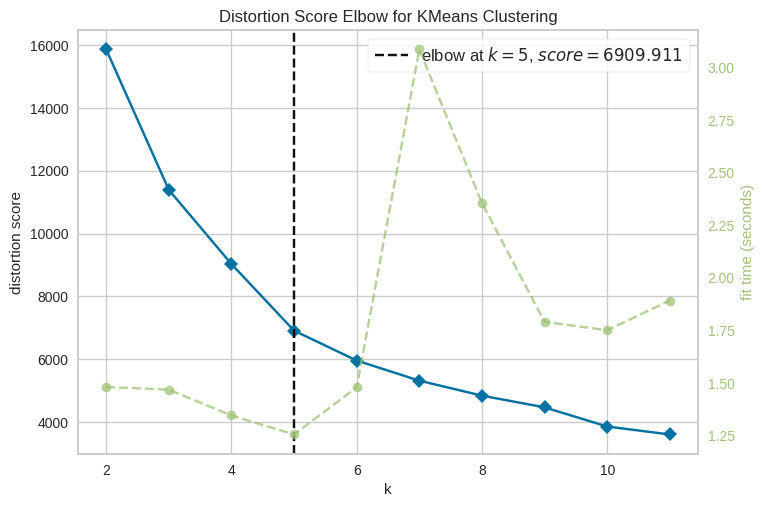

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
modelo = KMeans()
visualizer = KElbowVisualizer(modelo, k=(2, 12))
visualizer.fit(clientes_kmeans_scaled)
visualizer.show()

In [ ]:
kmeans = KMeans(n_clusters=5, random_state=101)
kmeans.fit(clientes_kmeans_scaled)
clusters = kmeans.predict(clientes_kmeans_scaled)
clientes_kmeans_scaled['cluster'] = clusters

columns = clientes_kmeans.columns
clientes_kmeans_coded = clientes_kmeans_scaled.copy()
clientes_kmeans_scaled[columns] = pd.DataFrame(scaler.inverse_transform(clientes_kmeans_scaled[columns]),
                                    columns=columns)
clientes_kmeans_scaled[['customer_state', 'payment_type', 'product_category_name']] = oe.inverse_transform(clientes_kmeans_scaled[['customer_state', 'payment_type', 'product_category_name']])


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
clientes_kmeans_coded

,customer_state,payment_type,payment_value,product_category_name,cluster
0,0.384615,0.333333,0.007269,0.222222,2
1,0.384615,0.000000,0.018912,0.555556,3
2,0.384615,0.000000,0.018912,0.555556,3
3,0.384615,0.000000,0.018912,0.555556,3
4,0.384615,0.000000,0.018912,0.444444,2
...,...,...,...,...,...
113329,0.538462,0.333333,0.010034,0.458333,2
113330,0.192308,0.333333,0.010393,0.611111,3
113331,0.846154,0.000000,0.003461,0.972222,1
113332,0.538462,0.666667,0.014075,0.111111,2


In [ ]:
clientes_kmeans_scaled

,customer_state,payment_type,payment_value,product_category_name,cluster
0,MG,credit_card,99.33,casa_construcao,2
1,MG,boleto,258.41,ferramentas_jardim,3
2,MG,boleto,258.41,ferramentas_jardim,3
3,MG,boleto,258.41,ferramentas_jardim,3
4,MG,boleto,258.41,esporte_lazer,2
...,...,...,...,...,...
113329,PB,credit_card,137.10,fashion_bolsas_e_acessorios,2
113330,CE,credit_card,142.01,informatica_acessorios,3
113331,RS,boleto,47.29,telefonia,1
113332,PB,debit_card,192.32,automotivo,2


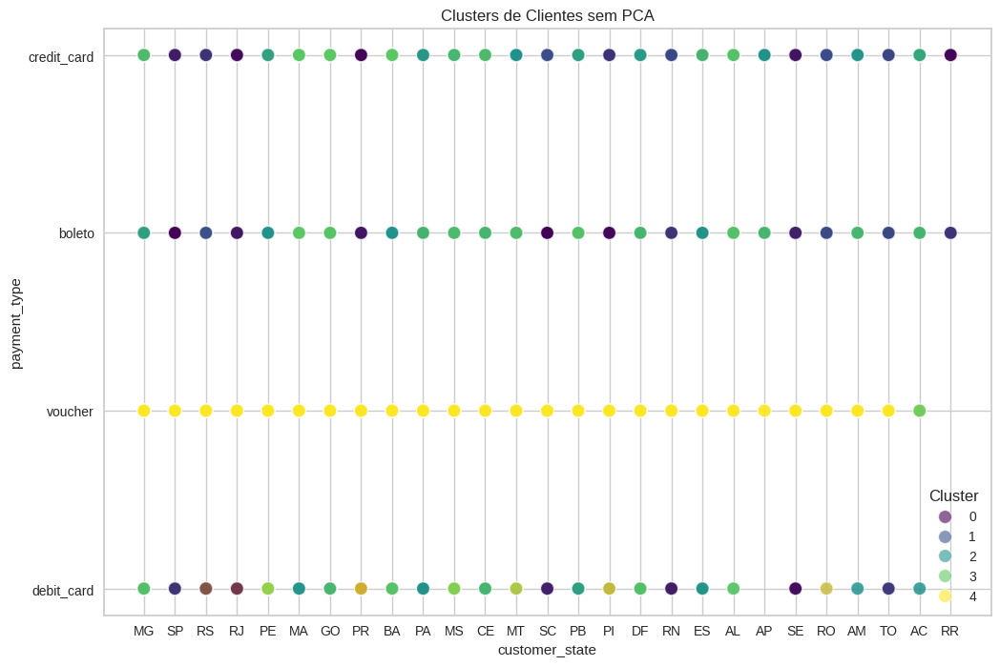

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(data=clientes_kmeans_scaled, x=clientes_kmeans_scaled.columns[0], y=clientes_kmeans_scaled.columns[1], hue='cluster', palette='viridis', s=100, alpha=0.6)
plt.title('Clusters de Clientes sem PCA')
plt.xlabel(clientes_kmeans_scaled.columns[0])
plt.ylabel(clientes_kmeans_scaled.columns[1])
plt.legend(title='Cluster')
plt.show()

In [ ]:
silhouette_avg = silhouette_score(clientes_kmeans_coded.drop(columns='cluster'), clusters)
print(f'Silhouette Score without PCA: {silhouette_avg}')

Silhouette Score without PCA: 0.41829226062271446


##Label Encolder

In [ ]:
labelencolder=df.copy()

In [ ]:
labelencolder.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,...,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,Latitude,Longitude,regiao,payment_type_encoded
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.8,...,27.0,17.0,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG,-17.756379,-41.486759,Sudeste,1
1,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,1,389d119b48cf3043d311335e499d9c6b,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste,0
2,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,3,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste,0
3,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,4,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste,0
4,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,2,774e21c631ca26cba7b5606bdca7460f,382229d1e840115ffe3dbf5ff460e417,2018-05-28 09:14:33,39.9,...,4.0,21.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste,0


In [ ]:
le = LabelEncoder()
labelencolder['payment_type_encoded'] = le.fit_transform(labelencolder['payment_type'])
labelencolder['customer_state_encoded'] = le.fit_transform(labelencolder['customer_state'])
labelencolder['product_category_name_encoded'] = le.fit_transform(labelencolder['product_category_name'])

clientes_kmeans_le = labelencolder[['Latitude','Longitude','payment_value','payment_type_encoded', 'payment_value', 'customer_state_encoded','product_category_name_encoded']]

scaler1 = MinMaxScaler()
clientes_kmeans_scaled_le = scaler1.fit_transform(clientes_kmeans_le)
clientes_kmeans_scaled_le = pd.DataFrame(clientes_kmeans_scaled_le, columns=clientes_kmeans_le.columns)


In [ ]:
clientes_kmeans_scaled_le.head()

,Latitude,Longitude,payment_value,payment_type_encoded,payment_value,customer_state_encoded,product_category_name_encoded
0,0.209981,0.487101,0.007269,0.333333,0.007269,0.384615,0.222222
1,0.209981,0.487101,0.018912,0.000000,0.018912,0.384615,0.555556
2,0.209981,0.487101,0.018912,0.000000,0.018912,0.384615,0.555556
3,0.209981,0.487101,0.018912,0.000000,0.018912,0.384615,0.555556
4,0.209981,0.487101,0.018912,0.000000,0.018912,0.384615,0.444444


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

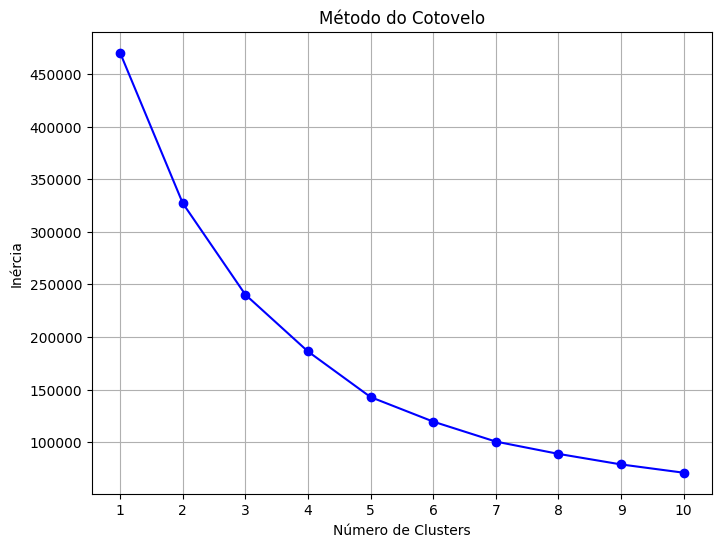

In [ ]:
inertia = []

# Calcular a inércia para diferentes valores de k
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(clientes_kmeans_le)
    inertia.append(kmeans.inertia_)

# Plotar o gráfico do método do cotovelo
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o', linestyle='-', color='b')
plt.xlabel('Número de Clusters')
plt.ylabel('Inércia')
plt.title('Método do Cotovelo')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

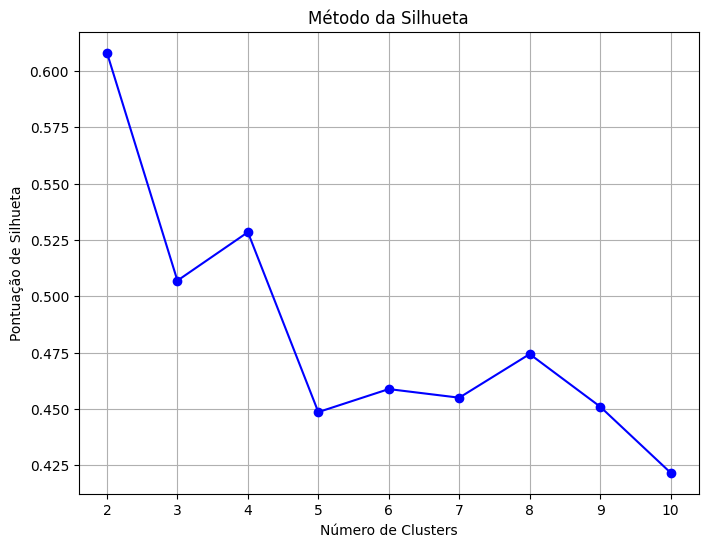

In [ ]:
silhouette_scores = []

# Calcular a silhueta para diferentes valores de k
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(clientes_kmeans_le)
    silhouette_avg = silhouette_score(clientes_kmeans_le, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plotar o gráfico do método da silhueta
plt.figure(figsize=(8, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='-', color='b')
plt.xlabel('Número de Clusters')
plt.ylabel('Pontuação de Silhueta')
plt.title('Método da Silhueta')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()

In [ ]:
clientes_kmeans_scaled_le

,Latitude,Longitude,payment_value,payment_type_encoded,payment_value,customer_state_encoded,product_category_name_encoded
0,0.209981,0.487101,0.007269,0.333333,0.007269,0.384615,0.222222
1,0.209981,0.487101,0.018912,0.000000,0.018912,0.384615,0.555556
2,0.209981,0.487101,0.018912,0.000000,0.018912,0.384615,0.555556
3,0.209981,0.487101,0.018912,0.000000,0.018912,0.384615,0.555556
4,0.209981,0.487101,0.018912,0.000000,0.018912,0.384615,0.444444
...,...,...,...,...,...,...,...
113329,0.352708,0.555816,0.010034,0.333333,0.010034,0.538462,0.458333
113330,0.387466,0.531644,0.010393,0.333333,0.010393,0.192308,0.611111
113331,0.052545,0.304187,0.003461,0.000000,0.003461,0.846154,0.972222
113332,0.349690,0.583167,0.014075,0.666667,0.014075,0.538462,0.111111


In [ ]:
# Escolher o número de clusters (substitua k pelo número de clusters desejado)
k = 5

# Criar o modelo de clusterização com o algoritmo K-means
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(clientes_kmeans_le)

# Adicionar os rótulos dos clusters aos dados
clientes_kmeans_le['Cluster'] = kmeans.labels_


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-115-117dfc86d584>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clientes_kmeans_le['Cluster'] = kmeans.labels_


In [ ]:
clientes_kmeans_le

,Latitude,Longitude,payment_value,payment_type_encoded,payment_value,customer_state_encoded,product_category_name_encoded,Cluster
0,-17.756379,-41.486759,99.33,1,99.33,10,16,0
1,-17.756379,-41.486759,258.41,0,258.41,10,40,3
2,-17.756379,-41.486759,258.41,0,258.41,10,40,3
3,-17.756379,-41.486759,258.41,0,258.41,10,40,3
4,-17.756379,-41.486759,258.41,0,258.41,10,32,3
...,...,...,...,...,...,...,...,...
117537,-6.927393,-37.097362,137.10,1,137.10,14,33,0
117538,-4.290234,-38.641443,142.01,1,142.01,5,44,0
117539,-29.701362,-53.170936,47.29,0,47.29,22,70,0
117540,-7.156304,-35.350227,192.32,2,192.32,14,8,0


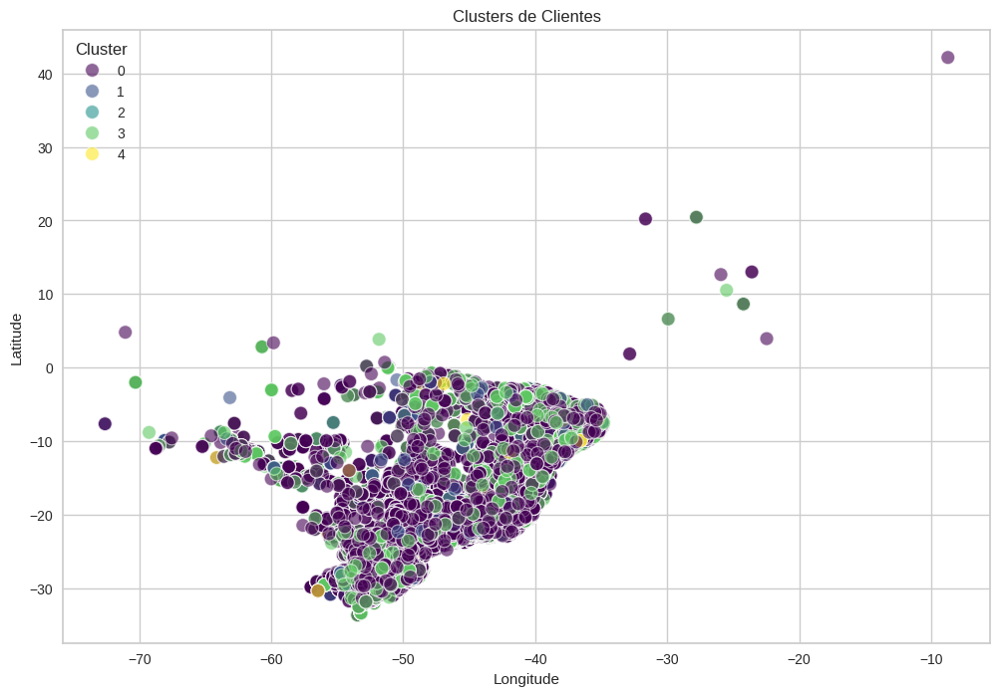

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(data=clientes_kmeans_le, x='Longitude', y='Latitude', hue='Cluster', palette='viridis', s=100, alpha=0.6)
plt.title('Clusters de Clientes')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Cluster')
plt.show()

In [ ]:
clientes_kmeans_le['Cluster'].value_counts()

Cluster
0    87388
3    21278
1     4015
4      632
2       21
Name: count, dtype: int64

##Analisando melhor as features para determinar o perfil dos clientes.

Notamos que com dados categoricos o uso de K-means é complicado, ainda mais quando visualizamos o pairplot somente as features com alta correlação aparecem de uma forma capaz de ocorrer separação, do qual não nos interessa. Vamos aplicar o modelo usando apenas váriaveis númericas.

In [ ]:
df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,...,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,Latitude,Longitude,regiao
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.8,...,17.0,27.0,17.0,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
1,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,1,389d119b48cf3043d311335e499d9c6b,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,37.0,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
2,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,3,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,37.0,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
3,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,4,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.9,...,37.0,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
4,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,2,774e21c631ca26cba7b5606bdca7460f,382229d1e840115ffe3dbf5ff460e417,2018-05-28 09:14:33,39.9,...,20.0,4.0,21.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste


In [ ]:
df.columns

Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'order_item_id', 'product_id',
       'seller_id', 'shipping_limit_date', 'price', 'freight_value',
       'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'Latitude', 'Longitude', 'regiao'],
      dtype='object')

In [ ]:
dataset_analise_perfil = df[['payment_value','payment_sequential','freight_value']]
dataset_analise_perfil.head()

,payment_value,payment_sequential,freight_value
0,99.33,1,19.53
1,258.41,1,9.09
2,258.41,1,18.18
3,258.41,1,18.18
4,258.41,1,11.36


In [ ]:
dataset_analise_perfil_localizacao = df[['payment_value','payment_sequential','freight_value','Latitude','Longitude']]
dataset_analise_perfil_localizacao.head()

,payment_value,payment_sequential,freight_value,Latitude,Longitude
0,99.33,1,19.53,-17.756379,-41.486759
1,258.41,1,9.09,-17.756379,-41.486759
2,258.41,1,18.18,-17.756379,-41.486759
3,258.41,1,18.18,-17.756379,-41.486759
4,258.41,1,11.36,-17.756379,-41.486759


##Métodos do cotovelo e da silhueta

In [ ]:
def calcular_silhueta(X, labels):
    return silhouette_score(X, labels)

In [ ]:
# Função para criar e mostrar o gráfico do cotovelo
def metodo_do_cotovelo(X, range_clusters=(2, 10)):
    model = KMeans()
    visualizer = KElbowVisualizer(model, k=range_clusters)
    visualizer.fit(X)
    visualizer.show()

# Função para criar e mostrar o gráfico de silhueta
def pontuacao_silhueta(X, n_clusters):
    model = KMeans(n_clusters=n_clusters, random_state=42)
    visualizer = SilhouetteVisualizer(model)
    visualizer.fit(X)
    visualizer.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

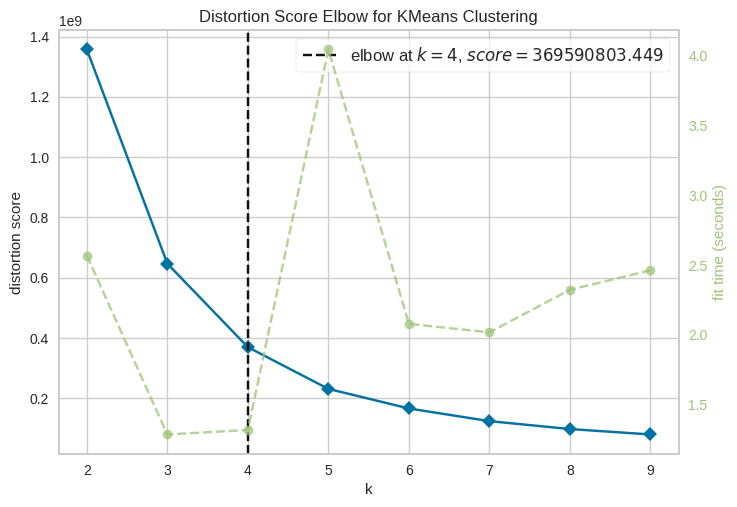

In [ ]:
metodo_do_cotovelo(dataset_analise_perfil)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


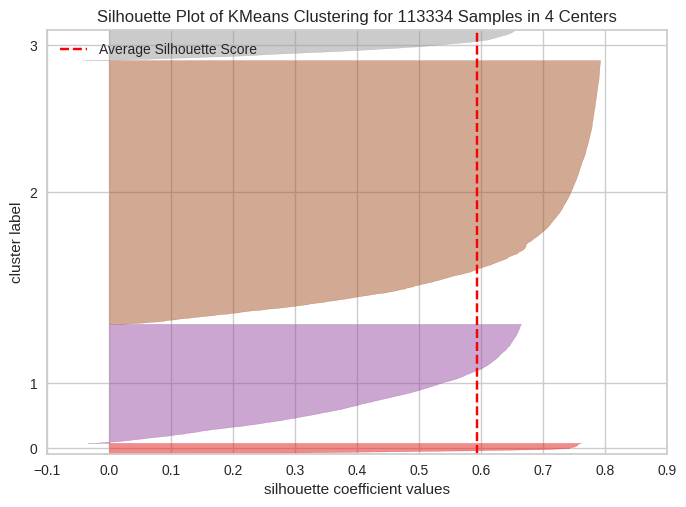

In [ ]:
pontuacao_silhueta(dataset_analise_perfil,4)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

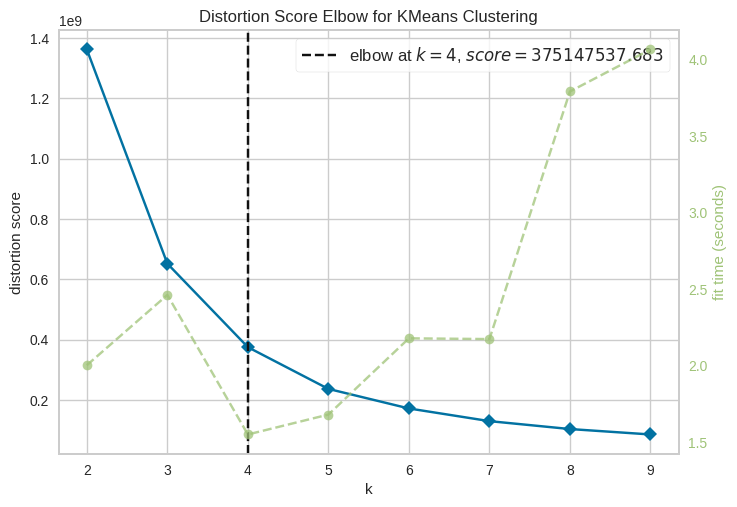

In [ ]:
metodo_do_cotovelo(dataset_analise_perfil_localizacao)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


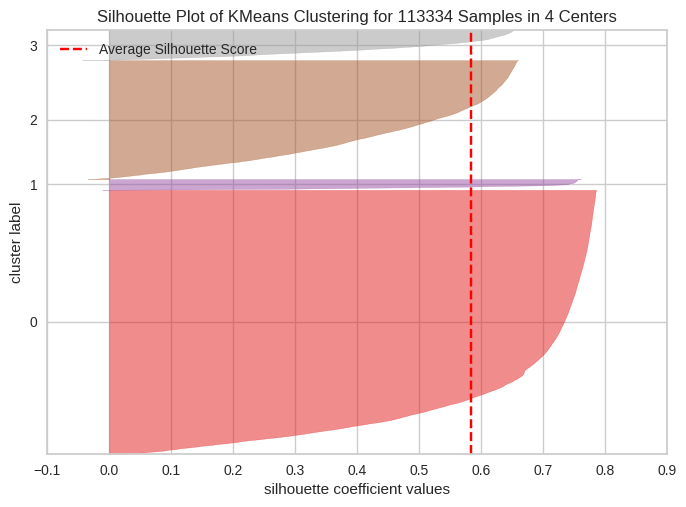

In [ ]:
pontuacao_silhueta(dataset_analise_perfil_localizacao,4)

O número de clusters deve ser 4 de acordo com o método do cotovelo e o da silhueta para confirmar o valor aceitável maior de 0.5.

##Aplicando o K-mens + RobustScaller

###Normalizando usando o RobustScaler

In [ ]:
normalizer = RobustScaler()
analise_perfil_normalized = normalizer.fit_transform(dataset_analise_perfil)

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=42)
labels_analise_perfil_normalized = kmeans.fit_predict(analise_perfil_normalized)
dataset_analise_perfil['cluster'] = labels_analise_perfil_normalized

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-165-cf1b1490fbb6>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_analise_perfil['cluster'] = labels_analise_perfil_normalized


In [ ]:
dataset_analise_perfil.head()

,payment_value,payment_sequential,freight_value,cluster
0,99.33,1,19.53,1
1,258.41,1,9.09,1
2,258.41,1,18.18,3
3,258.41,1,18.18,3
4,258.41,1,11.36,1


In [ ]:
dataset_analise_perfil['cluster'].value_counts()

cluster
1    75535
3    27922
2     5953
0     3924
Name: count, dtype: int64

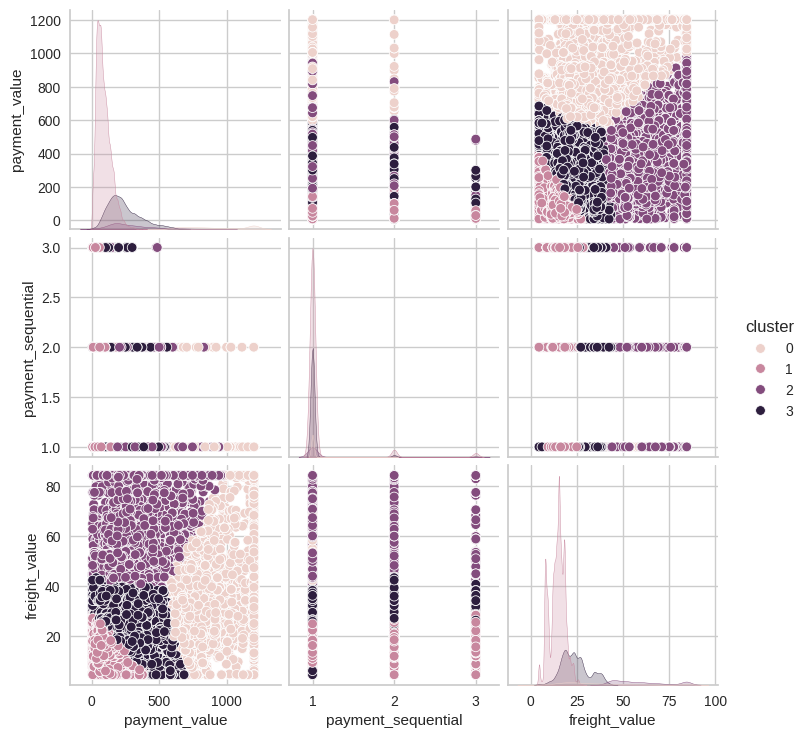

In [ ]:
sns.pairplot(data = dataset_analise_perfil,
            hue = 'cluster')

In [ ]:
silhueta_robustscaller = calcular_silhueta(dataset_analise_perfil, labels_analise_perfil_normalized)
print(f'Teste KMeans RobustScaler, Silhouette Score: {silhueta_robustscaller:.4f}')

Teste KMeans RobustScaler, Silhouette Score: 0.3911


##Modelo acrescentando as colunas de Latitude e Longitude

In [ ]:
analise_perfil_localizacao_normalized = normalizer.fit_transform(dataset_analise_perfil_localizacao)

In [ ]:
kmeans_localizacao = KMeans(n_clusters=4, random_state=42)
labels_perfil_localizacao_normalized = kmeans_localizacao.fit_predict(analise_perfil_localizacao_normalized)
dataset_analise_perfil_localizacao['cluster'] = labels_perfil_localizacao_normalized

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-174-cfca08ad8e26>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_analise_perfil_localizacao['cluster'] = labels_perfil_localizacao_normalized


In [ ]:
dataset_analise_perfil_localizacao.head()

,payment_value,payment_sequential,freight_value,Latitude,Longitude,cluster
0,99.33,1,19.53,-17.756379,-41.486759,0
1,258.41,1,9.09,-17.756379,-41.486759,0
2,258.41,1,18.18,-17.756379,-41.486759,0
3,258.41,1,18.18,-17.756379,-41.486759,0
4,258.41,1,11.36,-17.756379,-41.486759,0


In [ ]:
dataset_analise_perfil_localizacao['cluster'].value_counts()

cluster
0    88625
2    14489
1     5247
3     4973
Name: count, dtype: int64

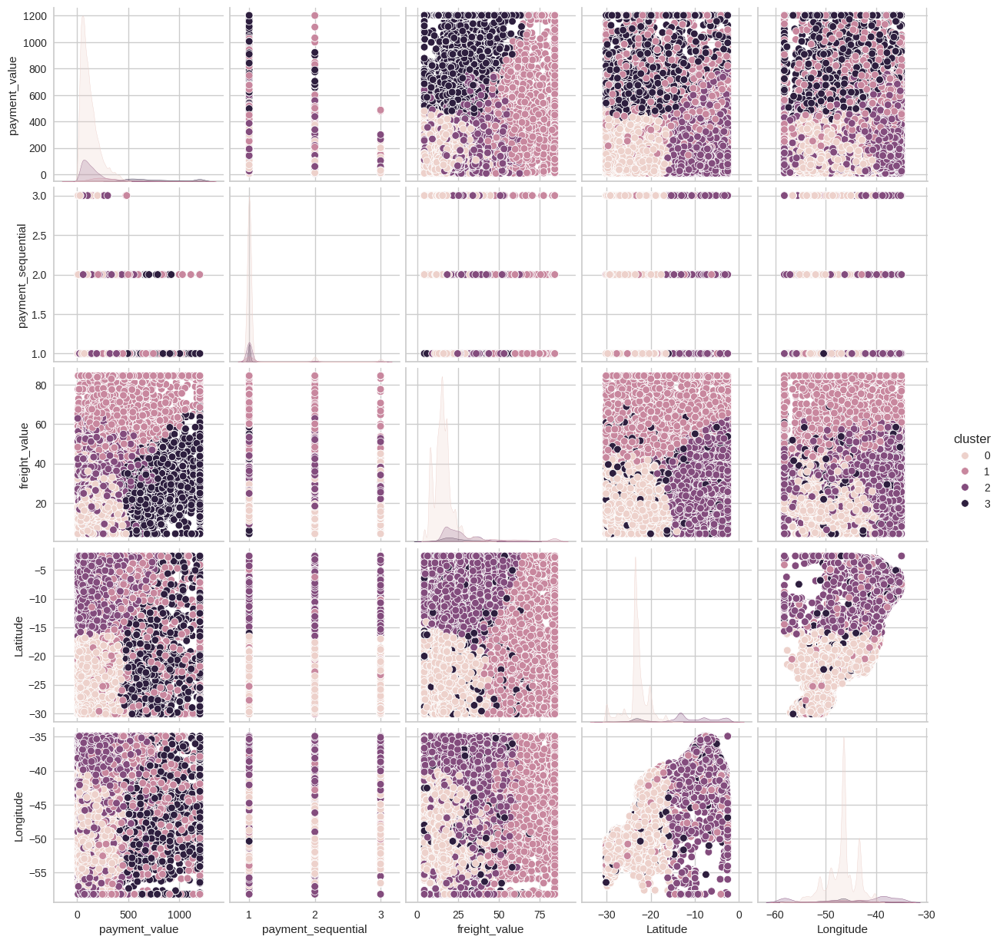

In [ ]:
sns.pairplot(data = dataset_analise_perfil_localizacao,
            hue = 'cluster')

In [ ]:
df.columns

Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'order_item_id', 'product_id',
       'seller_id', 'shipping_limit_date', 'price', 'freight_value',
       'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'Latitude', 'Longitude', 'regiao'],
      dtype='object')

In [ ]:
df.groupby('customer_unique_id')

In [ ]:
agrupando_por_cliente=df.groupby('customer_unique_id')
agrupando_por_cliente.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,...,product_length_cm,product_height_cm,product_width_cm,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,Latitude,Longitude,regiao
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,...,17.0,27.0,17.0,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
1,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,1,389d119b48cf3043d311335e499d9c6b,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.90,...,37.0,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
2,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,3,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.90,...,37.0,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
3,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,4,0bcc3eeca39e1064258aa1e932269894,1f50f920176fa81dab994f9023523100,2018-05-28 09:14:33,53.90,...,37.0,22.0,40.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
4,5b9a0e4cbfc2d6a1347472c847a4a4e1,1,boleto,1,258.41,2,774e21c631ca26cba7b5606bdca7460f,382229d1e840115ffe3dbf5ff460e417,2018-05-28 09:14:33,39.90,...,20.0,4.0,21.0,ed4c785e11a78a73c48fa3af98008292,39800,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117537,1e13bca551a3fd095b40e24798569805,1,credit_card,5,137.10,1,e4db070498b75e666a0736eb2f0abcd4,00d8b143d12632bad99c0ad66ad52825,2018-03-27 11:30:19,86.00,...,16.0,15.0,15.0,e78fe125c58587fde827b7249291d520,58625,sao mamede,PB,-6.927393,-37.097362,Nordeste
117538,117ce86d1ddbcdf65da3ff7fe763ed09,1,credit_card,4,142.01,1,70ad1cce006c26381f72387a1cdb2bf6,e49c26c3edfa46d227d5121a6b6e4d37,2017-06-20 00:55:58,123.89,...,16.0,45.0,20.0,ea638fb7f3303f3c72cf8e7af61a6a37,62795,barreira,CE,-4.290234,-38.641443,Nordeste
117539,8a096b1a1ab9573d96ff53df946afc68,1,boleto,1,47.29,1,8657986fc307b1b749c57763b90795f8,ea8482cd71df3c1969d7b9473ff13abc,2018-06-18 02:32:36,28.99,...,17.0,4.0,12.0,9ac3c0274eb2380d2812edf6752c15ae,96530,paraiso do sul,RS,-29.701362,-53.170936,Sul
117540,06eed67b7a87cac349143f3319c2b9fe,1,debit_card,1,192.32,1,f444092e1a9f9dedb91cf0717d6c4cff,17908cf9b444ee34047cadd5c0f4a516,2018-08-16 14:24:33,139.00,...,19.0,19.0,14.0,f9ccc64481a04c1a9886994895b97f03,58350,caldas brandao,PB,-7.156304,-35.350227,Nordeste


#Clusterização De Dados Categóricos e Mistos com K-Prototypes

##Primeiro passo calcular a dissimilaridade com a métrica Gower

Para variáveis numéricas, a distância euclidiana normalizada entre os valores de X e Y é utilizada, garantindo que todas as variáveis numéricas tenham o mesmo peso, independentemente da sua escala.

Para variáveis categóricas, a contribuição é binária, indicando simplesmente se os valores são iguais ou não. Os indicadores delta_{i}^{(num)} e delta_{i}^{(cat)} determinam a natureza da variável (numérica ou categórica), garantindo a aplicação correta da parte correspondente da fórmula para cada tipo de variável.

A soma dessas contribuições, dividida pelo número total de variáveis n, resulta na dissimilaridade geral entre X e Y.

Para fazer essa média ponderada, ele utiliza um hiperparâmetro chamado de lambda (λ). Por padrão, o valor de λ é 1. Porém, dependendo do seu problema, você pode alterá-lo. Quanto maior for o valor de λ, mais os dados numéricos influenciarão no cálculo da distância entre os dados e, consequentemente, na formação dos clusters. Por outro lado, quanto menor for o valor de λ, mais os dados categóricos influenciarão no cálculo da distância entre os dados e, consequentemente, na formação dos clusters.

In [ ]:
cluster_dados_mistos = df.copy()

In [ ]:
cluster_dados_mistos.columns

Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'order_item_id', 'product_id',
       'seller_id', 'shipping_limit_date', 'price', 'freight_value',
       'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'Latitude', 'Longitude', 'regiao'],
      dtype='object')

In [ ]:
cluster_dados_mistos.drop(columns=['order_id', 'payment_sequential', 'order_item_id', 'product_id','seller_id', 'shipping_limit_date', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date','order_delivered_customer_date', 'order_estimated_delivery_date','product_name_lenght','product_description_lenght', 'product_photos_qty',
       'product_weight_g','product_length_cm', 'product_height_cm', 'product_width_cm','customer_unique_id', 'customer_zip_code_prefix'],inplace=True)

In [ ]:
cluster_dados_mistos

,payment_type,payment_installments,payment_value,price,freight_value,product_category_name,customer_city,customer_state,Latitude,Longitude,regiao
0,credit_card,8,99.33,79.80,19.53,casa_construcao,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
1,boleto,1,258.41,53.90,9.09,ferramentas_jardim,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
2,boleto,1,258.41,53.90,18.18,ferramentas_jardim,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
3,boleto,1,258.41,53.90,18.18,ferramentas_jardim,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
4,boleto,1,258.41,39.90,11.36,esporte_lazer,teofilo otoni,MG,-17.756379,-41.486759,Sudeste
...,...,...,...,...,...,...,...,...,...,...,...
117537,credit_card,5,137.10,86.00,51.10,fashion_bolsas_e_acessorios,sao mamede,PB,-6.927393,-37.097362,Nordeste
117538,credit_card,4,142.01,123.89,18.12,informatica_acessorios,barreira,CE,-4.290234,-38.641443,Nordeste
117539,boleto,1,47.29,28.99,18.30,telefonia,paraiso do sul,RS,-29.701362,-53.170936,Sul
117540,debit_card,1,192.32,139.00,53.32,automotivo,caldas brandao,PB,-7.156304,-35.350227,Nordeste


Normalizando os dados númerico com RobustScaller

In [ ]:
cat_col = cluster_dados_mistos.select_dtypes(exclude="number").columns.to_list()
df_categoricas = cluster_dados_mistos[cat_col]


In [ ]:
# Inicializar o normalizador
normalizer = RobustScaler()

# Selecionar apenas as colunas numéricas
colunas_numericas = cluster_dados_mistos.select_dtypes(include="number").columns

# Aplicar a normalização nas colunas selecionadas
cluster_dados_mistos[colunas_numericas] = normalizer.fit_transform(cluster_dados_mistos[colunas_numericas])


In [ ]:
cluster_dados_mistos

,payment_type,payment_installments,payment_value,price,freight_value,product_category_name,customer_city,customer_state,Latitude,Longitude,regiao
0,credit_card,2.000000,-0.068747,0.052236,0.395320,casa_construcao,teofilo otoni,MG,1.568269,0.981646,Sudeste
1,boleto,-0.333333,1.170484,-0.223869,-0.890394,ferramentas_jardim,teofilo otoni,MG,1.568269,0.981646,Sudeste
2,boleto,-0.333333,1.170484,-0.223869,0.229064,ferramentas_jardim,teofilo otoni,MG,1.568269,0.981646,Sudeste
3,boleto,-0.333333,1.170484,-0.223869,0.229064,ferramentas_jardim,teofilo otoni,MG,1.568269,0.981646,Sudeste
4,boleto,-0.333333,1.170484,-0.373114,-0.610837,esporte_lazer,teofilo otoni,MG,1.568269,0.981646,Sudeste
...,...,...,...,...,...,...,...,...,...,...,...
117537,credit_card,1.000000,0.225481,0.118331,4.283251,fashion_bolsas_e_acessorios,sao mamede,PB,4.859020,1.863198,Nordeste
117538,credit_card,0.666667,0.263730,0.522254,0.221675,informatica_acessorios,barreira,CE,5.660409,1.553090,Nordeste
117539,boleto,-0.333333,-0.474137,-0.489420,0.243842,telefonia,paraiso do sul,RS,-2.061614,-1.364967,Sul
117540,debit_card,-0.333333,0.655644,0.683332,4.556650,automotivo,caldas brandao,PB,4.789457,2.214087,Nordeste


In [ ]:
categorical = ["payment_type","product_category_name", "customer_city", "customer_state","regiao"]
categorical_indices = [cluster_dados_mistos.columns.get_loc(col) for col in categorical]

# Aplicar K-Prototypes
kproto = KPrototypes(n_clusters=4, random_state=42)
clusters = kproto.fit_predict(cluster_dados_mistos, categorical = categorical_indices)

# Adicionar os clusters ao DataFrame original
cluster_dados_mistos['cluster'] = clusters



In [ ]:
cluster_dados_mistos

,payment_type,payment_installments,payment_value,price,freight_value,product_category_name,customer_city,customer_state,Latitude,Longitude,regiao,cluster
0,credit_card,2.000000,-0.068747,0.052236,0.395320,casa_construcao,teofilo otoni,MG,1.568269,0.981646,Sudeste,0
1,boleto,-0.333333,1.170484,-0.223869,-0.890394,ferramentas_jardim,teofilo otoni,MG,1.568269,0.981646,Sudeste,0
2,boleto,-0.333333,1.170484,-0.223869,0.229064,ferramentas_jardim,teofilo otoni,MG,1.568269,0.981646,Sudeste,0
3,boleto,-0.333333,1.170484,-0.223869,0.229064,ferramentas_jardim,teofilo otoni,MG,1.568269,0.981646,Sudeste,0
4,boleto,-0.333333,1.170484,-0.373114,-0.610837,esporte_lazer,teofilo otoni,MG,1.568269,0.981646,Sudeste,0
...,...,...,...,...,...,...,...,...,...,...,...,...
117537,credit_card,1.000000,0.225481,0.118331,4.283251,fashion_bolsas_e_acessorios,sao mamede,PB,4.859020,1.863198,Nordeste,2
117538,credit_card,0.666667,0.263730,0.522254,0.221675,informatica_acessorios,barreira,CE,5.660409,1.553090,Nordeste,2
117539,boleto,-0.333333,-0.474137,-0.489420,0.243842,telefonia,paraiso do sul,RS,-2.061614,-1.364967,Sul,0
117540,debit_card,-0.333333,0.655644,0.683332,4.556650,automotivo,caldas brandao,PB,4.789457,2.214087,Nordeste,2


In [ ]:
cluster_dados_mistos['cluster'].value_counts()

cluster
0    88657
2    14726
3     8985
1      966
Name: count, dtype: int64

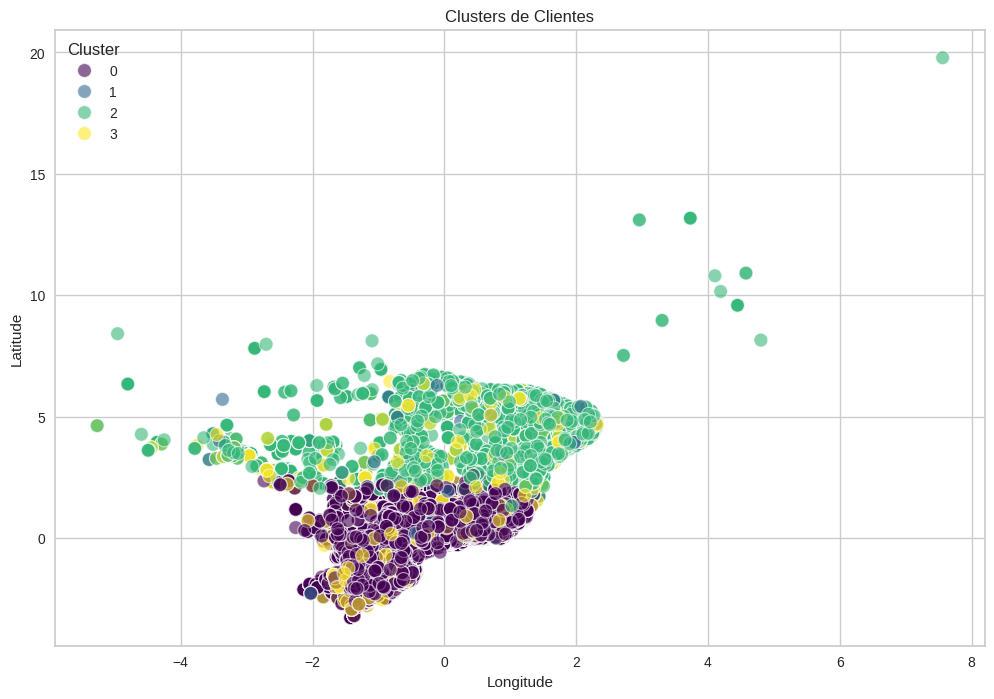

In [ ]:
# Plotar os dados com os clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(data=cluster_dados_mistos, x='Longitude', y='Latitude', hue='cluster', palette='viridis', s=100, alpha=0.6)
plt.title('Clusters de Clientes')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Cluster')
plt.show()

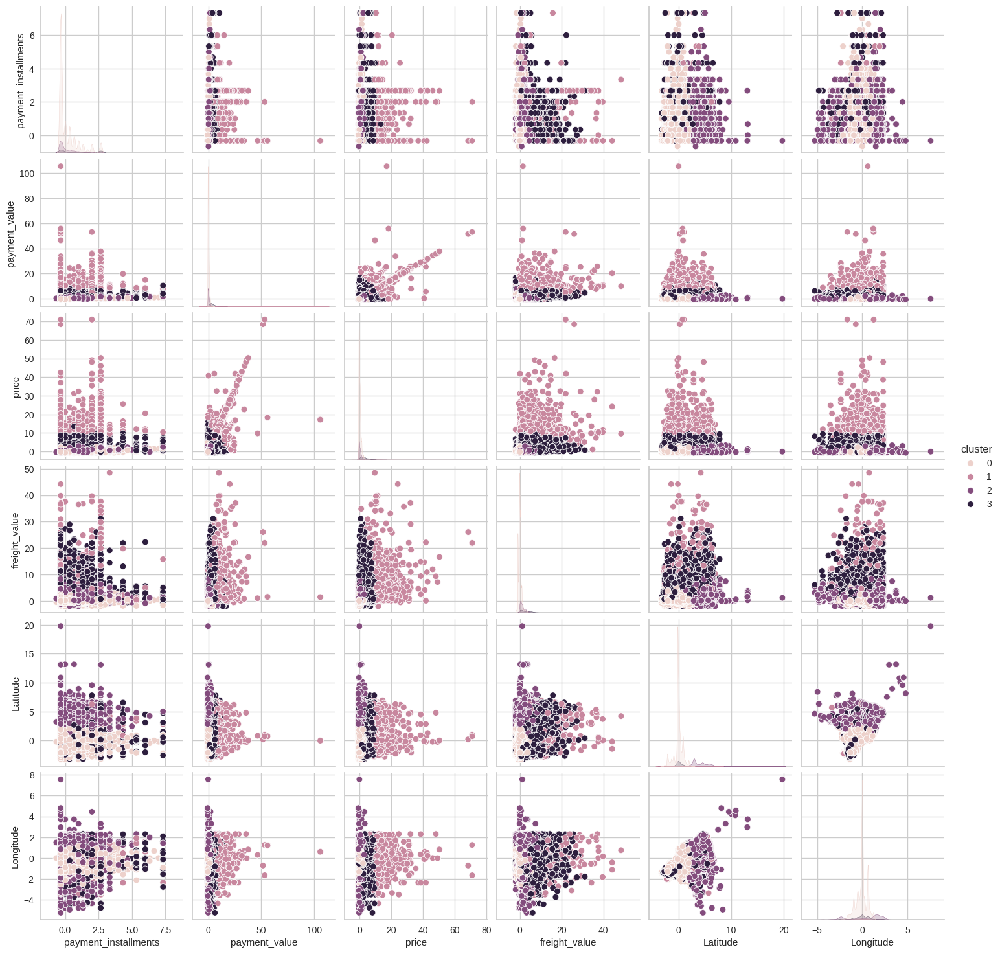

In [ ]:
sns.pairplot(data = cluster_dados_mistos,
            hue = 'cluster')